In [1]:
#coding=utf-8
# standard library
import gc
import importlib
import os
import sys
import pickle
import socket
import statistics
import struct
import time
from datetime import datetime

# pip3 library
import psutil
import scipy
import tqdm
import numpy as np
import pandas as pd
import sklearn.cluster as cluster
import xgboost as xgb

# custom functions
import matplotlib.pyplot as plt
import gan_func
importlib.reload(gan_func)  # For reloading after making changes
from gan_func import *
plt.style.use('ggplot')     # select plt style

Using TensorFlow backend.


-------------------------
Check memory
[472806289408, 466153332736]
[472806289408, 466151571456]
-------------------------
Load Dataset
size      265.204550
times    3148.815194
dtype: float64 size      108.657790
times    5217.479075
dtype: float64
   count
0  12764
1   3545
Data preprocessing finish
Start to setting GAN


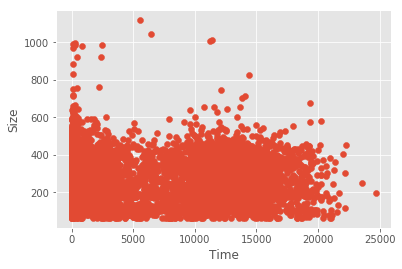

In [2]:
# collect trash and check memory
check_memory()

server_ip = '192.168.1.133'
client_ip = '124.123.243.15'

# Load engineered dataset from EDA section
#data = pd.read_csv('skype_eth_5.csv')
print('Load Dataset')
label_cols = ['Class']
'''
# different src ip addr && dst ip addr
mask1 = data['src'] == server_ip
mask2 = data['src'] == client_ip
dataSample = data.loc[(mask1 | mask2)]
mask3 = dataSample['dst'] == client_ip
mask4 = dataSample['dst'] == server_ip
dataSample = dataSample.loc[(mask3 | mask4)]
# dataSample = data.loc[data['dst'] == server_ip]
dataSample['time'] = dataSample['time'].apply(check_time_format)
dataSample['date'] = dataSample['date'].apply(lambda x: x.replace('-', ' '))
dataSample['times'] = dataSample['date'] + ' ' + dataSample['time']
dataSample['times'] = dataSample['times'].apply(lambda x: datetime.strptime(x, '%Y %m %d %H:%M:%S.%f').timestamp())
dataSample['times'] = dataSample['times'].apply(lambda x: float(str(x)[6:]) * 1e6) # x[0:5] in timestamp are all the same

# calculate relative value
prev_times = 0
for index, row in dataSample.iterrows():
    dataSample.at[index, 'size'] = float(row['size'])
    original_val = row['times']
    new_val = original_val - prev_times
    prev_times = row['times']
    dataSample.at[index, 'times'] = new_val

# filter src && dst
dataSample = dataSample.loc[dataSample['src'] == client_ip]
dataSample = dataSample.loc[dataSample['dst'] == server_ip]

# remove times
dataSample.drop(dataSample[dataSample.times > 25000].index, inplace=True)
dataSample.drop(dataSample[dataSample.times < 0].index, inplace=True)

# remove unused column
dataSample.drop('date', axis=1, inplace=True)
dataSample.drop('src', axis=1, inplace=True)
dataSample.drop('dst', axis=1, inplace=True)
dataSample.drop('time', axis=1, inplace=True)
dataSample.drop('number', axis=1, inplace=True)
dataSample.drop('clean_size', axis=1, inplace=True)

# save traffic
dataSample.to_csv('client_traffic.csv')
'''
dataSample = pd.read_csv('client_traffic.csv')
dataSample = dataSample[['size', 'times']]
dataSample_o = pd.read_csv('../server/server_traffic.csv')
dataSample_o = dataSample_o[['size', 'times']]



normalized_dataSample = (dataSample - dataSample.mean()) / dataSample.std()                     # Zero-mean normalization  
normalized_dataSample_o = (dataSample_o - dataSample_o.mean()) / dataSample_o.std()
# normalized_dataSample = (dataSample - dataSample.min()) / (dataSample.max() - dataSample.min()) # Min-max normalization
data_cols = ['times', 'size']
print(dataSample.mean(), dataSample.std())

# Add KMeans generated classes to fraud data - see classification section for more details on this
train = normalized_dataSample.copy()
train_o = normalized_dataSample_o.copy()
labels = cluster.KMeans(n_clusters=2, random_state=0).fit_predict(train[data_cols])
print(pd.DataFrame([[np.sum(labels == i)] for i in np.unique(labels)], columns=['count'], index=np.unique(labels)))
print('Data preprocessing finish')


# Generate arguments and training the GAN and WGAN architectures, WGAN are use WGAN-GP
print('Start to setting GAN')
fraud_w_classes = train.copy()

# print the original data figure
origin = dataSample.values.copy()
x2 = origin[:, 1]
y2 = origin[:, 0]
plt.scatter(x2, y2)
plt.xlabel('Time')
plt.ylabel('Size')
plt.show()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32)           0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 33)           0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 128)          4352        concatenate_1[0][0]              
__________

Step: 0 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0266, -0.0252, 0.0992, 0.9865
D Real - D Gen: 0.1244


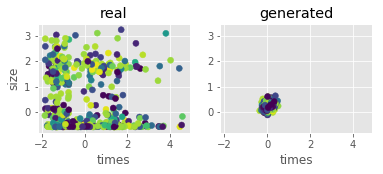

Step: 100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0277, 0.0508, 0.1203, 0.8938
D Real - D Gen: 0.0696


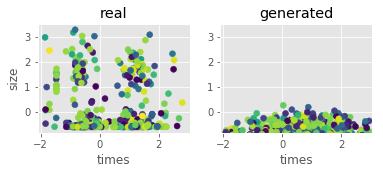

Step: 200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0042, 0.0019, 0.0443, 0.8108
D Real - D Gen: 0.0424


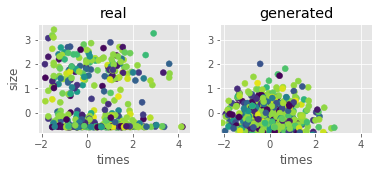

Step: 300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0097, 0.0159, 0.0615, 0.7896
D Real - D Gen: 0.0455


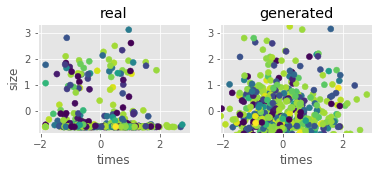

Step: 400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0449, 0.0295, 0.0580, 0.8301
D Real - D Gen: 0.0284


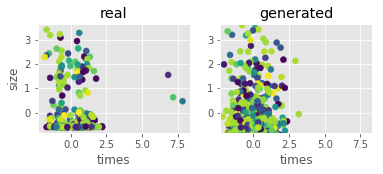

Step: 500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0042, 0.0037, 0.0380, 0.8571
D Real - D Gen: 0.0343


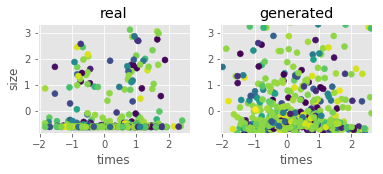

Step: 600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0216, -0.0359, -0.0040, 0.7355
D Real - D Gen: 0.0319


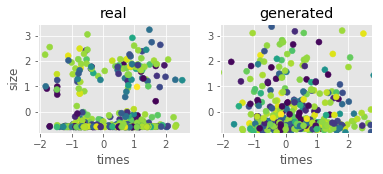

Step: 700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0004, -0.0179, 0.0158, 0.7181
D Real - D Gen: 0.0337


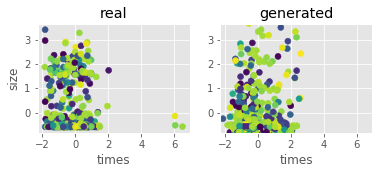

Step: 800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0128, -0.0227, -0.0116, 0.7336
D Real - D Gen: 0.0111


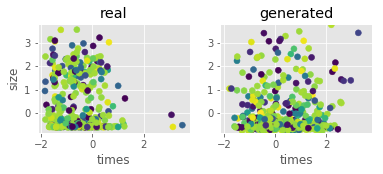

Step: 900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0012, 0.0016, 0.0314, 0.6757
D Real - D Gen: 0.0298


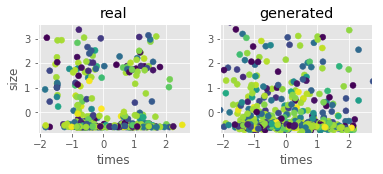

Step: 1000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0227, -0.0184, -0.0069, 0.7664
D Real - D Gen: 0.0114


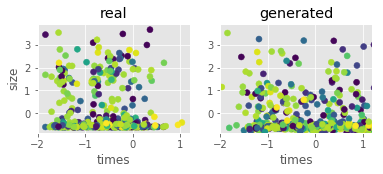

Step: 1100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0033, 0.0014, 0.0182, 0.7336
D Real - D Gen: 0.0168


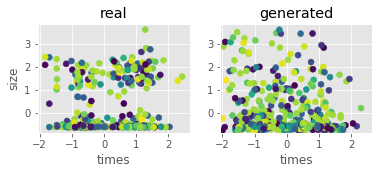

Step: 1200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0033, -0.0059, 0.0046, 0.6718
D Real - D Gen: 0.0105


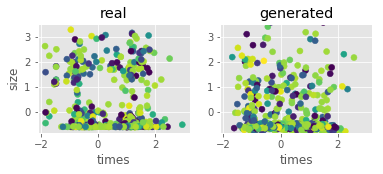

Step: 1300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0097, -0.0231, -0.0060, 0.8108
D Real - D Gen: 0.0172


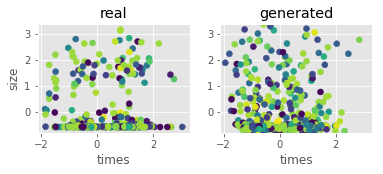

Step: 1400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0025, -0.0068, 0.0136, 0.6660
D Real - D Gen: 0.0203


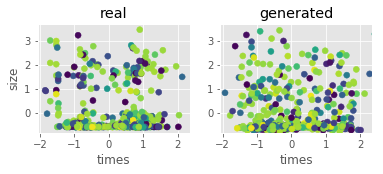

Step: 1500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0006, 0.0255, 0.0179, 0.7336
D Real - D Gen: -0.0076


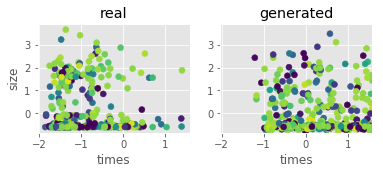

Step: 1600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0279, 0.0170, 0.0226, 0.7085
D Real - D Gen: 0.0057


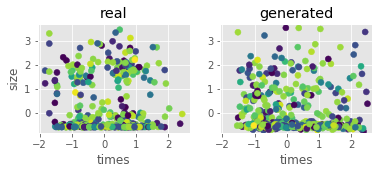

Step: 1700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0242, 0.0221, 0.0054, 0.6313
D Real - D Gen: -0.0167


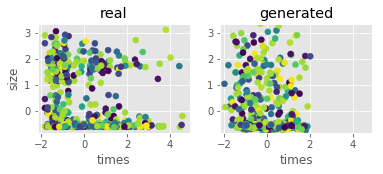

Step: 1800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0513, 0.0538, 0.0598, 0.7529
D Real - D Gen: 0.0060


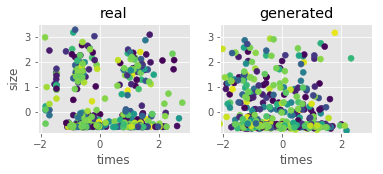

Step: 1900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0594, 0.0782, 0.0708, 0.6834
D Real - D Gen: -0.0074


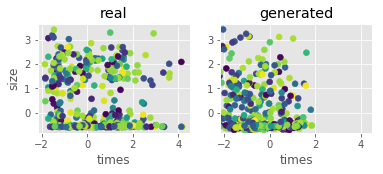

Step: 2000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0556, 0.0478, 0.0578, 0.7162
D Real - D Gen: 0.0100


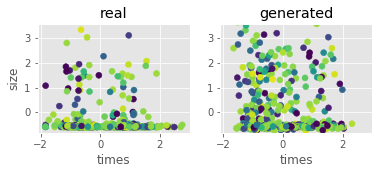

Step: 2100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0554, 0.0722, 0.0916, 0.7259
D Real - D Gen: 0.0194


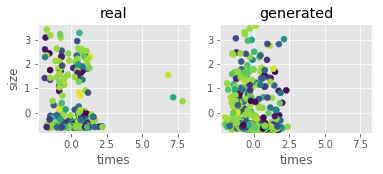

Step: 2200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0480, 0.0415, 0.0636, 0.6042
D Real - D Gen: 0.0221


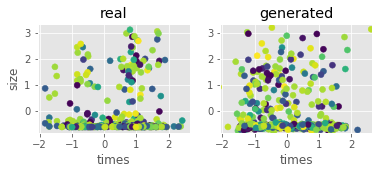

Step: 2300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0869, 0.0864, 0.1121, 0.7432
D Real - D Gen: 0.0257


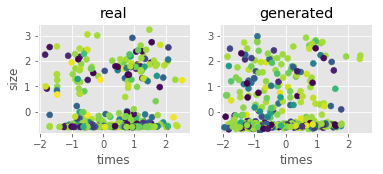

Step: 2400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0730, 0.0618, 0.0547, 0.7317
D Real - D Gen: -0.0071


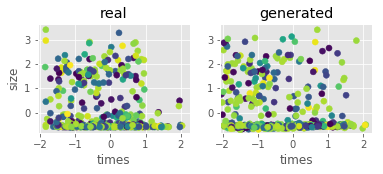

Step: 2500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0511, 0.0663, 0.0638, 0.7220
D Real - D Gen: -0.0026


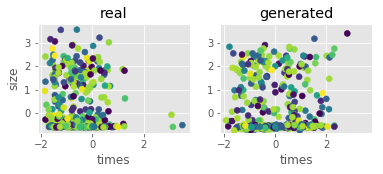

Step: 2600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0601, 0.0560, 0.0565, 0.6409
D Real - D Gen: 0.0005


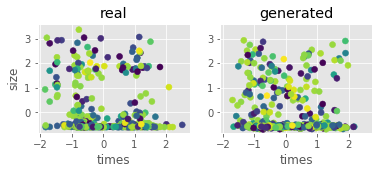

Step: 2700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0137, 0.0260, 0.0459, 0.7297
D Real - D Gen: 0.0199


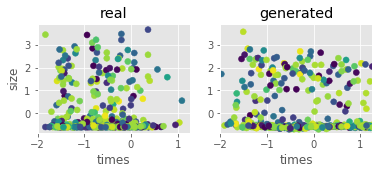

Step: 2800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1019, 0.1062, 0.1091, 0.6390
D Real - D Gen: 0.0029


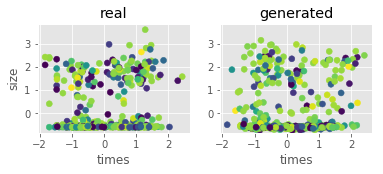

Step: 2900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0393, 0.0315, 0.0827, 0.7027
D Real - D Gen: 0.0512


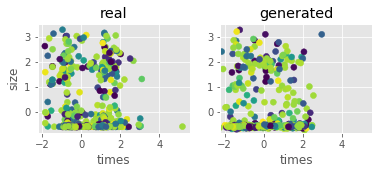

Step: 3000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1001, 0.1020, 0.0828, 0.6332
D Real - D Gen: -0.0192


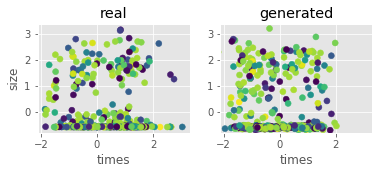

Step: 3100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0835, 0.0600, 0.0959, 0.7375
D Real - D Gen: 0.0359


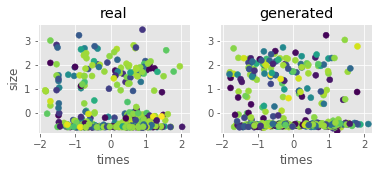

Step: 3200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0845, 0.0733, 0.0991, 0.7529
D Real - D Gen: 0.0258


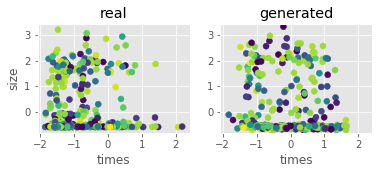

Step: 3300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0518, 0.0491, 0.0422, 0.6776
D Real - D Gen: -0.0069


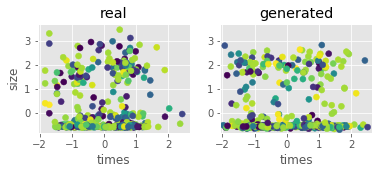

Step: 3400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0521, 0.0564, 0.0522, 0.7046
D Real - D Gen: -0.0043


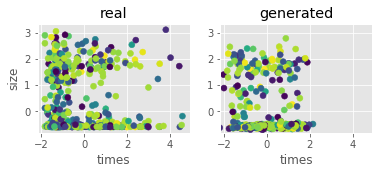

Step: 3500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1038, 0.0933, 0.0912, 0.7124
D Real - D Gen: -0.0022


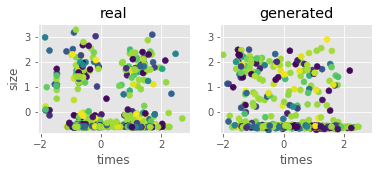

Step: 3600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0337, 0.0289, 0.0313, 0.6178
D Real - D Gen: 0.0024


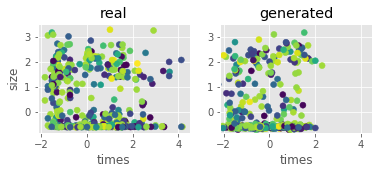

Step: 3700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1171, 0.1138, 0.1246, 0.7413
D Real - D Gen: 0.0107


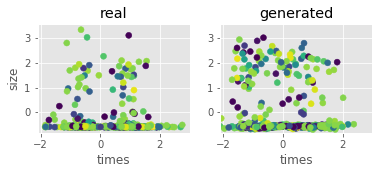

Step: 3800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0681, 0.0731, 0.0788, 0.7490
D Real - D Gen: 0.0058


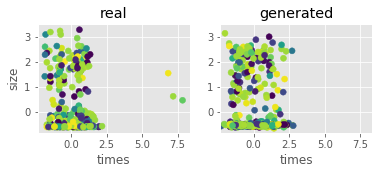

Step: 3900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0678, 0.0805, 0.0745, 0.6506
D Real - D Gen: -0.0060


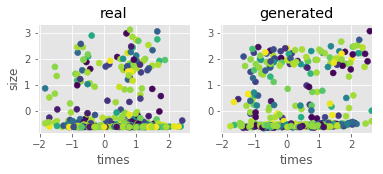

Step: 4000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0597, 0.0520, 0.0596, 0.7490
D Real - D Gen: 0.0075


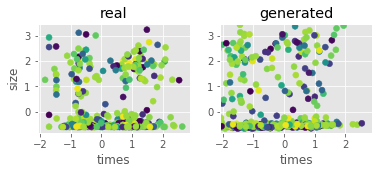

Step: 4100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0509, 0.0513, 0.0481, 0.7181
D Real - D Gen: -0.0033


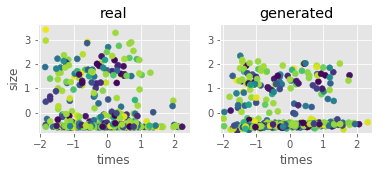

Step: 4200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0616, 0.0675, 0.0603, 0.7529
D Real - D Gen: -0.0072


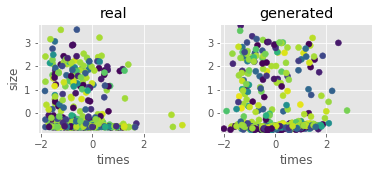

Step: 4300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0664, 0.0527, 0.0933, 0.6873
D Real - D Gen: 0.0405


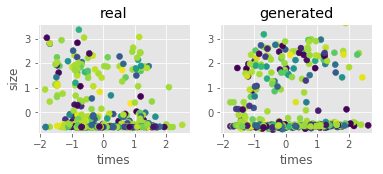

Step: 4400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0682, 0.0607, 0.0607, 0.7239
D Real - D Gen: -0.0001


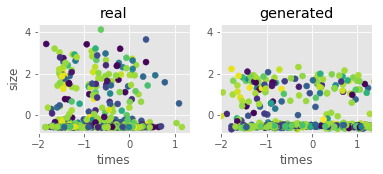

Step: 4500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1181, 0.1086, 0.1200, 0.7143
D Real - D Gen: 0.0114


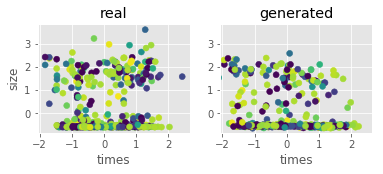

Step: 4600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0660, 0.0552, 0.0232, 0.7375
D Real - D Gen: -0.0320


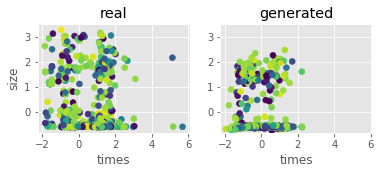

Step: 4700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0566, 0.0600, 0.0684, 0.7162
D Real - D Gen: 0.0083


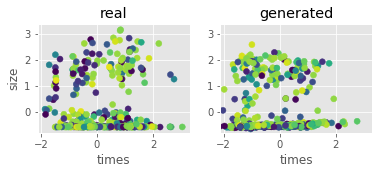

Step: 4800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0623, 0.0612, 0.0489, 0.6931
D Real - D Gen: -0.0123


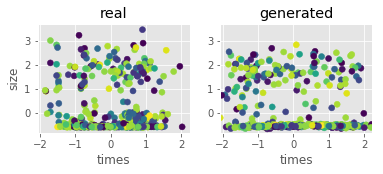

Step: 4900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0326, 0.0373, 0.0137, 0.8378
D Real - D Gen: -0.0236


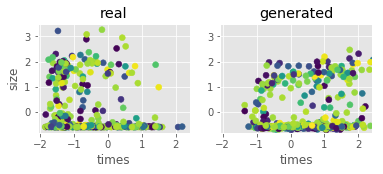

Step: 5000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0418, 0.0428, 0.0499, 0.6931
D Real - D Gen: 0.0072


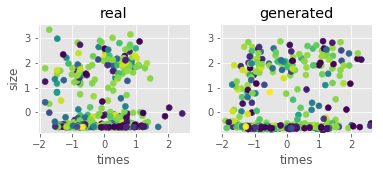

Step: 5100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0783, 0.0865, 0.0775, 0.6834
D Real - D Gen: -0.0090


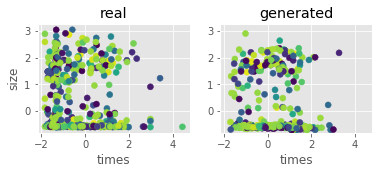

Step: 5200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0706, 0.0578, 0.0460, 0.7143
D Real - D Gen: -0.0118


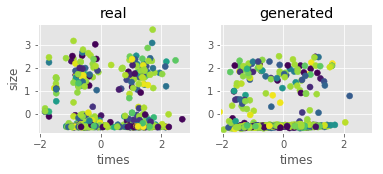

Step: 5300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0589, 0.0549, 0.0679, 0.6834
D Real - D Gen: 0.0130


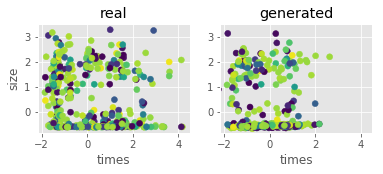

Step: 5400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0249, 0.0082, 0.0325, 0.8050
D Real - D Gen: 0.0243


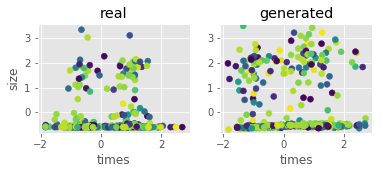

Step: 5500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0872, 0.0920, 0.1040, 0.6313
D Real - D Gen: 0.0120


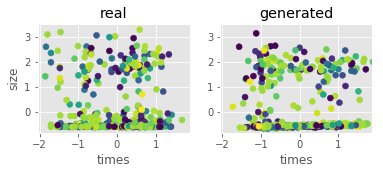

Step: 5600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0839, 0.0878, 0.0796, 0.7085
D Real - D Gen: -0.0082


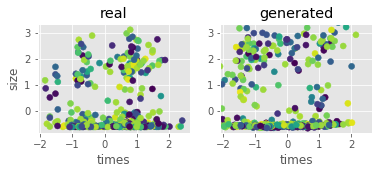

Step: 5700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0542, 0.0518, 0.0591, 0.7066
D Real - D Gen: 0.0073


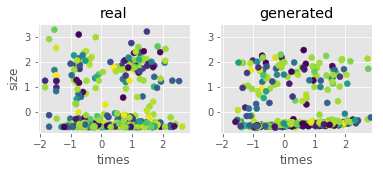

Step: 5800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0777, 0.0759, 0.0784, 0.6853
D Real - D Gen: 0.0025


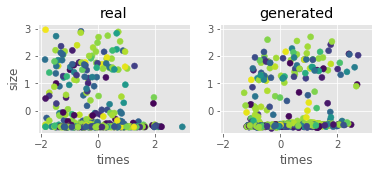

Step: 5900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0700, 0.0811, 0.0515, 0.6699
D Real - D Gen: -0.0296


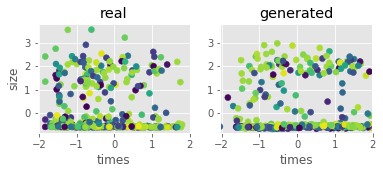

Step: 6000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0782, 0.0841, 0.0710, 0.7876
D Real - D Gen: -0.0131


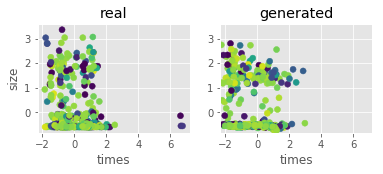

Step: 6100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1018, 0.0947, 0.1097, 0.7876
D Real - D Gen: 0.0150


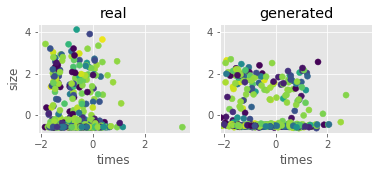

Step: 6200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0526, 0.0341, 0.0193, 0.6988
D Real - D Gen: -0.0148


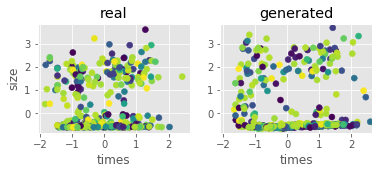

Step: 6300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0539, 0.0596, 0.0552, 0.7104
D Real - D Gen: -0.0044


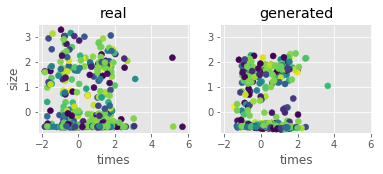

Step: 6400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0950, 0.1177, 0.1241, 0.7066
D Real - D Gen: 0.0064


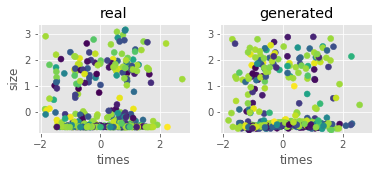

Step: 6500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0387, 0.0419, 0.0406, 0.7046
D Real - D Gen: -0.0014


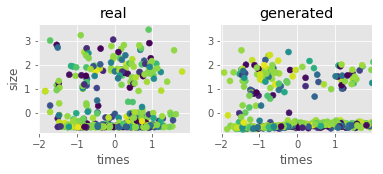

Step: 6600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0983, 0.1018, 0.0942, 0.7490
D Real - D Gen: -0.0076


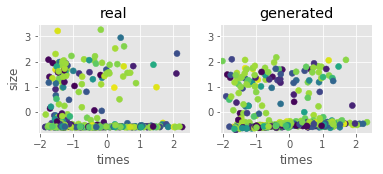

Step: 6700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0554, 0.0698, 0.0694, 0.7297
D Real - D Gen: -0.0004


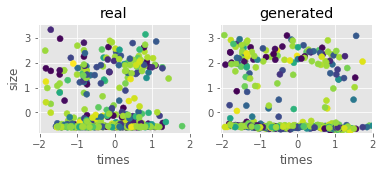

Step: 6800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1278, 0.1138, 0.1214, 0.7394
D Real - D Gen: 0.0076


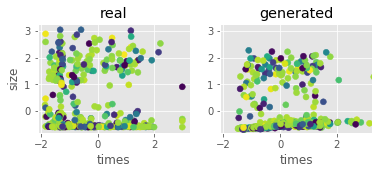

Step: 6900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1313, 0.1286, 0.1468, 0.7317
D Real - D Gen: 0.0182


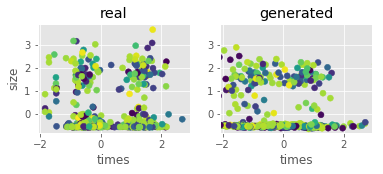

Step: 7000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1426, 0.1225, 0.1300, 0.6718
D Real - D Gen: 0.0075


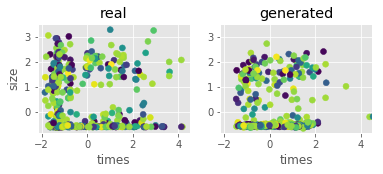

Step: 7100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1330, 0.1425, 0.1166, 0.7857
D Real - D Gen: -0.0259


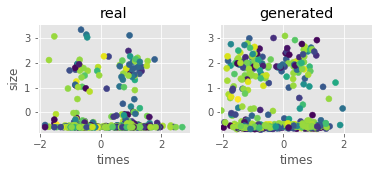

Step: 7200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0751, 0.0580, 0.0613, 0.6448
D Real - D Gen: 0.0032


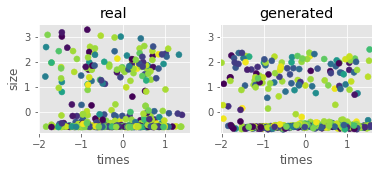

Step: 7300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0773, 0.0767, 0.1064, 0.6911
D Real - D Gen: 0.0297


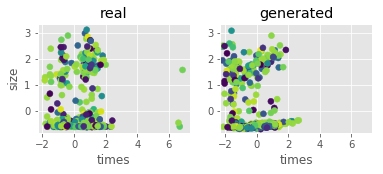

Step: 7400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1477, 0.1581, 0.1604, 0.7085
D Real - D Gen: 0.0022


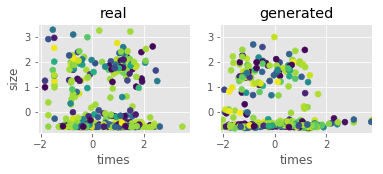

Step: 7500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1165, 0.1197, 0.1296, 0.6950
D Real - D Gen: 0.0099


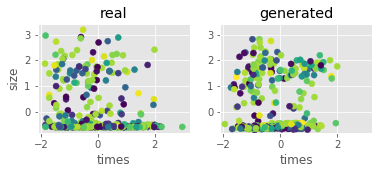

Step: 7600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0663, 0.0830, 0.0872, 0.7085
D Real - D Gen: 0.0041


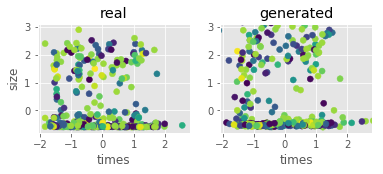

Step: 7700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1067, 0.0890, 0.1073, 0.7394
D Real - D Gen: 0.0183


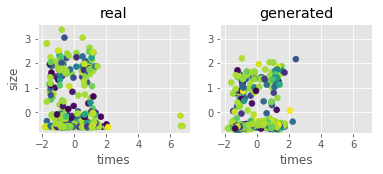

Step: 7800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1699, 0.2000, 0.1840, 0.6873
D Real - D Gen: -0.0160


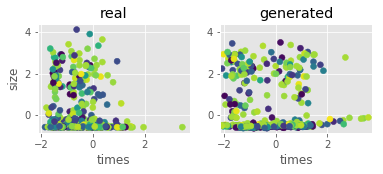

Step: 7900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1271, 0.1179, 0.1224, 0.6853
D Real - D Gen: 0.0045


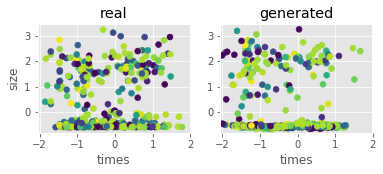

Step: 8000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0824, 0.0779, 0.0787, 0.6988
D Real - D Gen: 0.0009


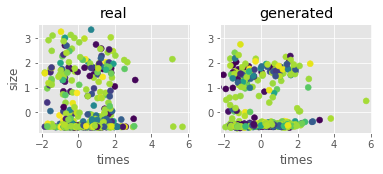

Step: 8100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1375, 0.1447, 0.1250, 0.6718
D Real - D Gen: -0.0197


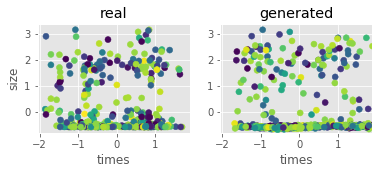

Step: 8200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1118, 0.0918, 0.0899, 0.7239
D Real - D Gen: -0.0019


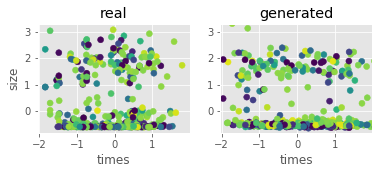

Step: 8300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1547, 0.1596, 0.1604, 0.7703
D Real - D Gen: 0.0008


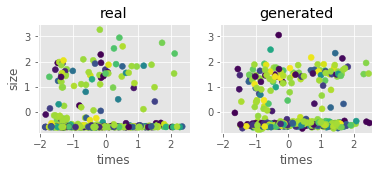

Step: 8400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1624, 0.1435, 0.1661, 0.7683
D Real - D Gen: 0.0226


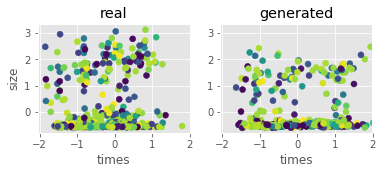

Step: 8500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1362, 0.1473, 0.1428, 0.6660
D Real - D Gen: -0.0045


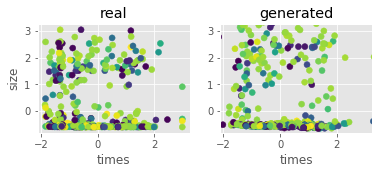

Step: 8600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1406, 0.1516, 0.1595, 0.7432
D Real - D Gen: 0.0079


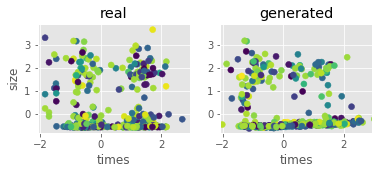

Step: 8700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2240, 0.2259, 0.2232, 0.6931
D Real - D Gen: -0.0027


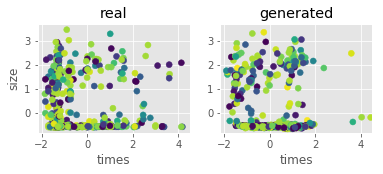

Step: 8800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1867, 0.1902, 0.2277, 0.6564
D Real - D Gen: 0.0375


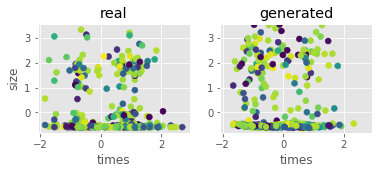

Step: 8900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1808, 0.1815, 0.1746, 0.6757
D Real - D Gen: -0.0068


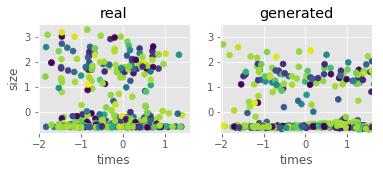

Step: 9000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2498, 0.2412, 0.2533, 0.7220
D Real - D Gen: 0.0121


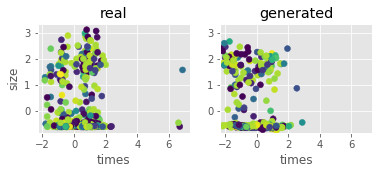

Step: 9100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1991, 0.1864, 0.1643, 0.7683
D Real - D Gen: -0.0221


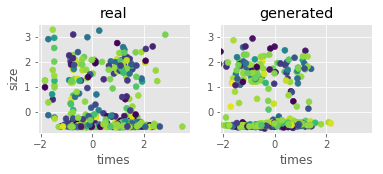

Step: 9200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1596, 0.1373, 0.1768, 0.7568
D Real - D Gen: 0.0395


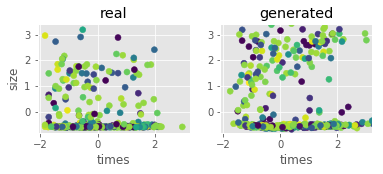

Step: 9300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1539, 0.1568, 0.1675, 0.6969
D Real - D Gen: 0.0107


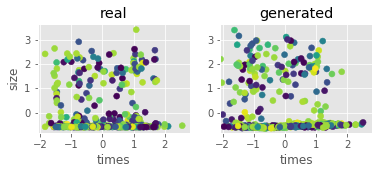

Step: 9400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1855, 0.1855, 0.1606, 0.6815
D Real - D Gen: -0.0249


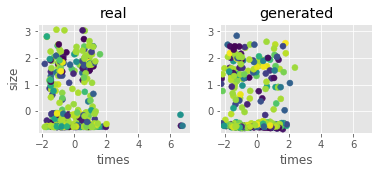

Step: 9500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1873, 0.1902, 0.2055, 0.6988
D Real - D Gen: 0.0153


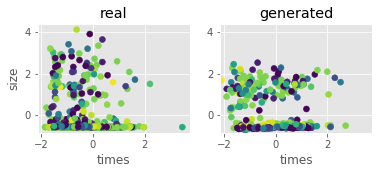

Step: 9600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1925, 0.1937, 0.2202, 0.7085
D Real - D Gen: 0.0265


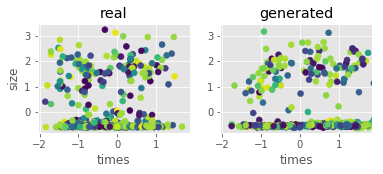

Step: 9700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1864, 0.1898, 0.1937, 0.7046
D Real - D Gen: 0.0039


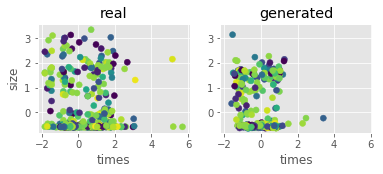

Step: 9800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1826, 0.1922, 0.1842, 0.7143
D Real - D Gen: -0.0080


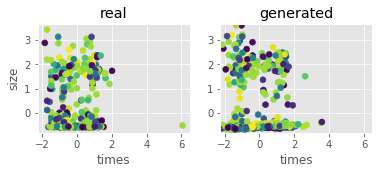

Step: 9900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1176, 0.1213, 0.1204, 0.7220
D Real - D Gen: -0.0009


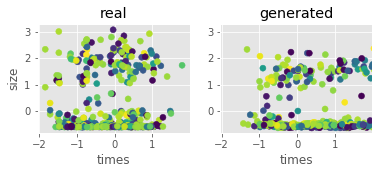

Step: 10000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1474, 0.1596, 0.1614, 0.8263
D Real - D Gen: 0.0018


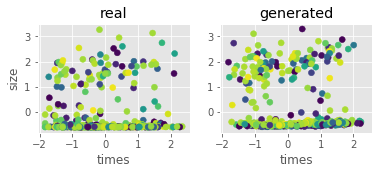

Step: 10100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1097, 0.1175, 0.1093, 0.6467
D Real - D Gen: -0.0082


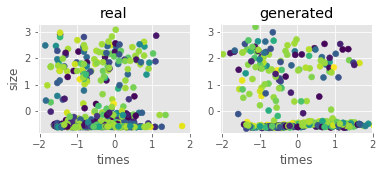

Step: 10200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2139, 0.2021, 0.2170, 0.6680
D Real - D Gen: 0.0150


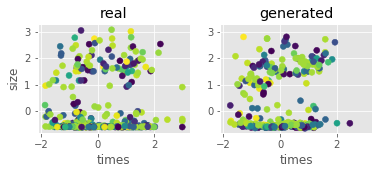

Step: 10300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1903, 0.1904, 0.2171, 0.7124
D Real - D Gen: 0.0267


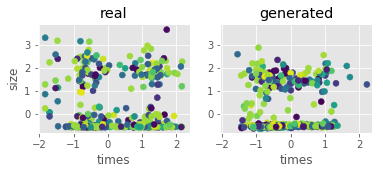

Step: 10400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1494, 0.1489, 0.1297, 0.7046
D Real - D Gen: -0.0192


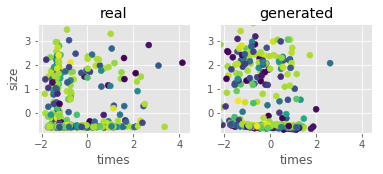

Step: 10500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1344, 0.1262, 0.1175, 0.6544
D Real - D Gen: -0.0086


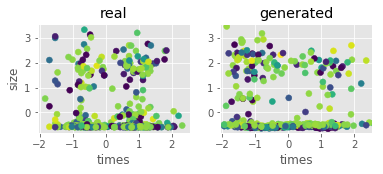

Step: 10600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1768, 0.1698, 0.1739, 0.6988
D Real - D Gen: 0.0041


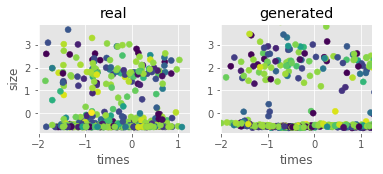

Step: 10700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1037, 0.0931, 0.1218, 0.7317
D Real - D Gen: 0.0287


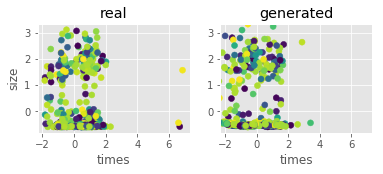

Step: 10800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1390, 0.1418, 0.1416, 0.6931
D Real - D Gen: -0.0001


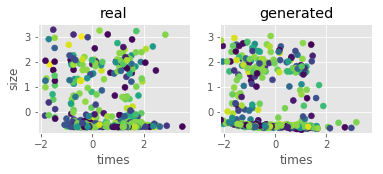

Step: 10900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1810, 0.1729, 0.1763, 0.7992
D Real - D Gen: 0.0034


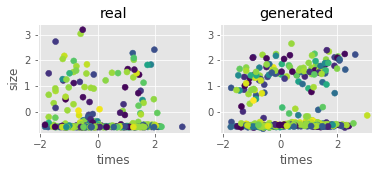

Step: 11000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1839, 0.1782, 0.1827, 0.6255
D Real - D Gen: 0.0045


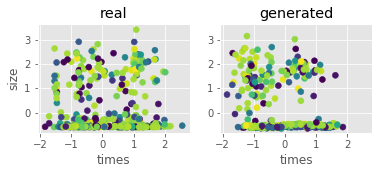

Step: 11100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1140, 0.1135, 0.1098, 0.7394
D Real - D Gen: -0.0038


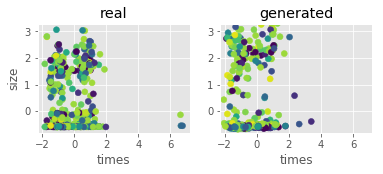

Step: 11200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1860, 0.1959, 0.1604, 0.6583
D Real - D Gen: -0.0355


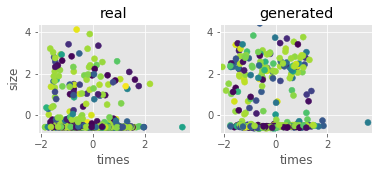

Step: 11300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2442, 0.2461, 0.2532, 0.7413
D Real - D Gen: 0.0071


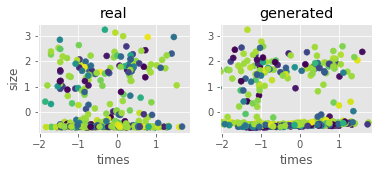

Step: 11400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2079, 0.1929, 0.2022, 0.7046
D Real - D Gen: 0.0094


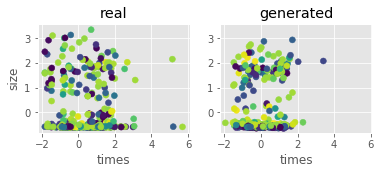

Step: 11500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2041, 0.2109, 0.1904, 0.7683
D Real - D Gen: -0.0205


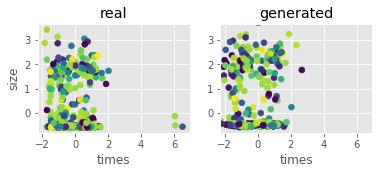

Step: 11600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1566, 0.1696, 0.1781, 0.7085
D Real - D Gen: 0.0085


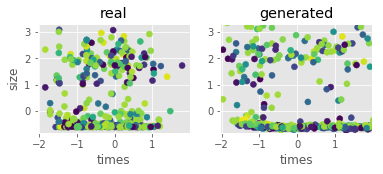

Step: 11700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2380, 0.2407, 0.2431, 0.7529
D Real - D Gen: 0.0024


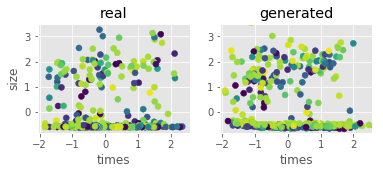

Step: 11800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1426, 0.1593, 0.1582, 0.7046
D Real - D Gen: -0.0011


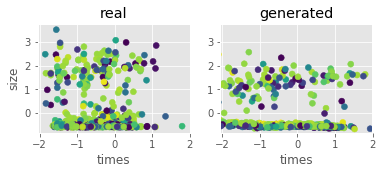

Step: 11900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1933, 0.2154, 0.2246, 0.7317
D Real - D Gen: 0.0092


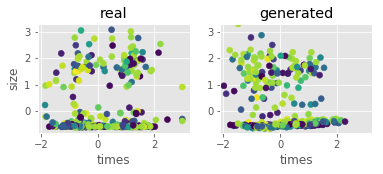

Step: 12000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1783, 0.2026, 0.1937, 0.7915
D Real - D Gen: -0.0088


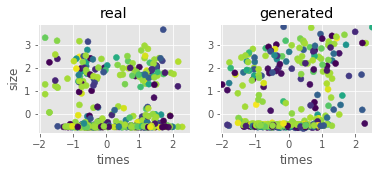

Step: 12100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1467, 0.1537, 0.1434, 0.7973
D Real - D Gen: -0.0104


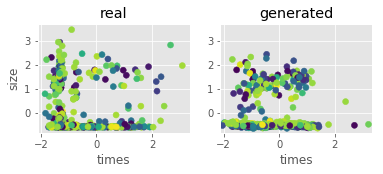

Step: 12200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1150, 0.1111, 0.1002, 0.7259
D Real - D Gen: -0.0109


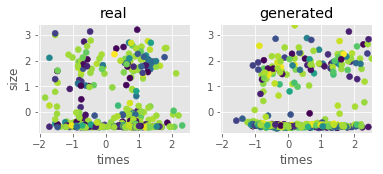

Step: 12300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1363, 0.1314, 0.1148, 0.7104
D Real - D Gen: -0.0166


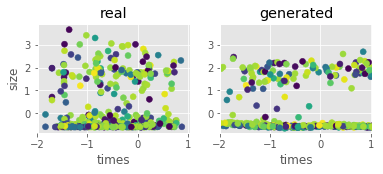

Step: 12400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1400, 0.1197, 0.1454, 0.7181
D Real - D Gen: 0.0257


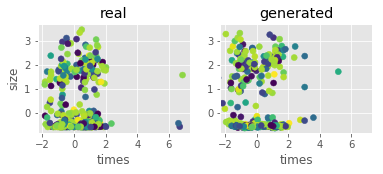

Step: 12500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1815, 0.1980, 0.1857, 0.7162
D Real - D Gen: -0.0123


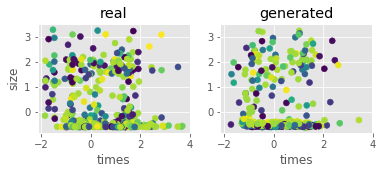

Step: 12600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1576, 0.1472, 0.1828, 0.7355
D Real - D Gen: 0.0356


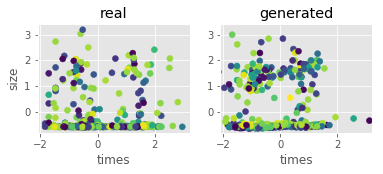

Step: 12700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1801, 0.1568, 0.1507, 0.7104
D Real - D Gen: -0.0060


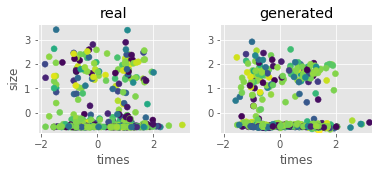

Step: 12800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2121, 0.2208, 0.2237, 0.7375
D Real - D Gen: 0.0029


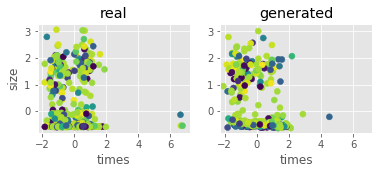

Step: 12900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1651, 0.1871, 0.2073, 0.8205
D Real - D Gen: 0.0202


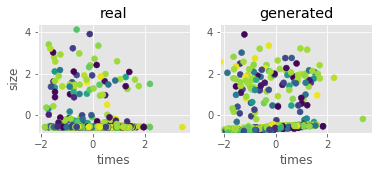

Step: 13000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1959, 0.1456, 0.1502, 0.6660
D Real - D Gen: 0.0046


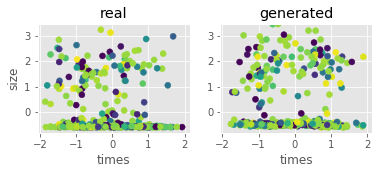

Step: 13100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1843, 0.1870, 0.1499, 0.7008
D Real - D Gen: -0.0372


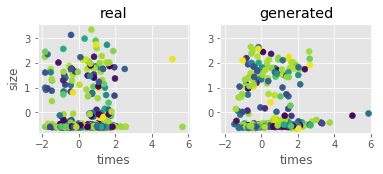

Step: 13200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1736, 0.1797, 0.1823, 0.7278
D Real - D Gen: 0.0027


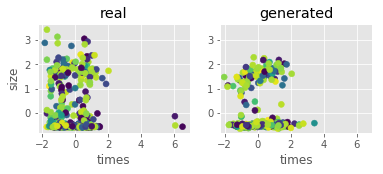

Step: 13300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2025, 0.2141, 0.2355, 0.7838
D Real - D Gen: 0.0214


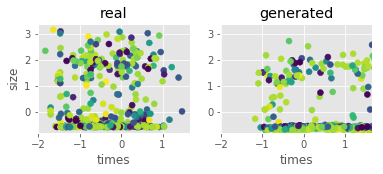

Step: 13400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1440, 0.1652, 0.1306, 0.7490
D Real - D Gen: -0.0346


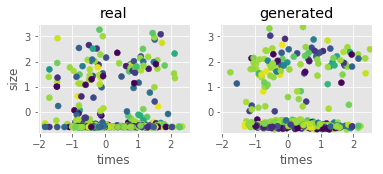

Step: 13500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1705, 0.1528, 0.1524, 0.8243
D Real - D Gen: -0.0004


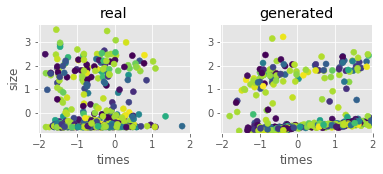

Step: 13600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0503, 0.0356, -0.0115, 0.7780
D Real - D Gen: -0.0471


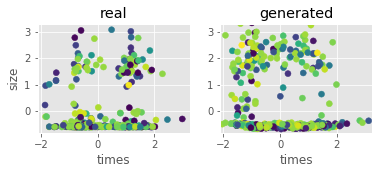

Step: 13700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1333, 0.0818, 0.0766, 0.7741
D Real - D Gen: -0.0051


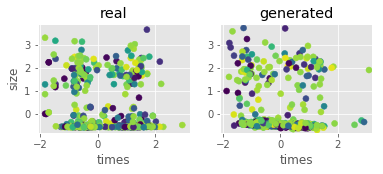

Step: 13800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1302, 0.1620, 0.1514, 0.6873
D Real - D Gen: -0.0106


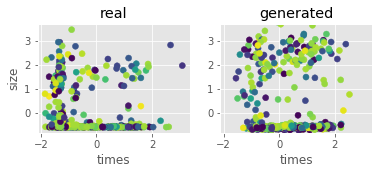

Step: 13900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0911, 0.0283, 0.0117, 0.6718
D Real - D Gen: -0.0166


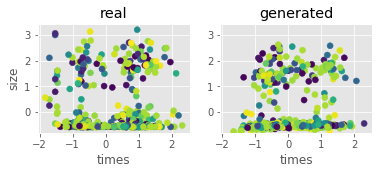

Step: 14000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1224, 0.1111, 0.1048, 0.7201
D Real - D Gen: -0.0063


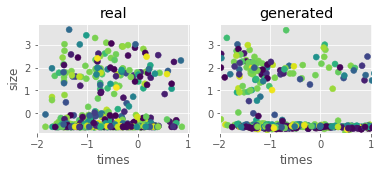

Step: 14100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1131, 0.1374, 0.1341, 0.7413
D Real - D Gen: -0.0033


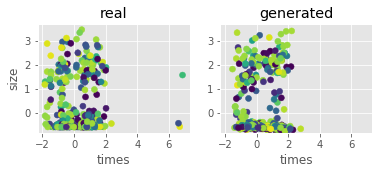

Step: 14200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1178, 0.1076, 0.1098, 0.7471
D Real - D Gen: 0.0021


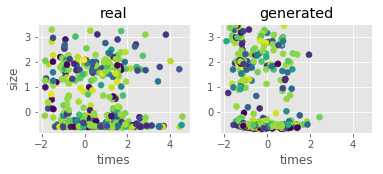

Step: 14300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1420, 0.1275, 0.1506, 0.7336
D Real - D Gen: 0.0231


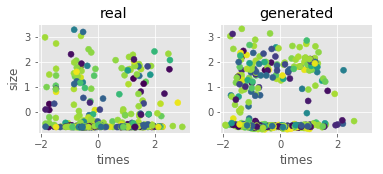

Step: 14400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1032, 0.1537, 0.1644, 0.8861
D Real - D Gen: 0.0107


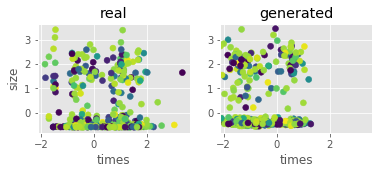

Step: 14500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1702, 0.1890, 0.1815, 0.7317
D Real - D Gen: -0.0075


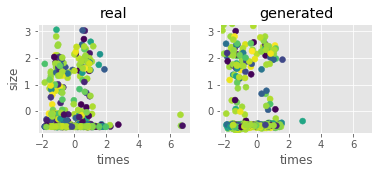

Step: 14600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0977, 0.0915, 0.1105, 0.8417
D Real - D Gen: 0.0190


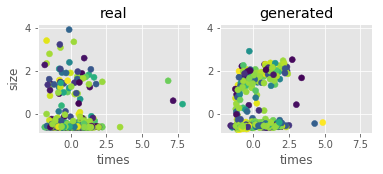

Step: 14700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0642, 0.0886, 0.1062, 0.7799
D Real - D Gen: 0.0176


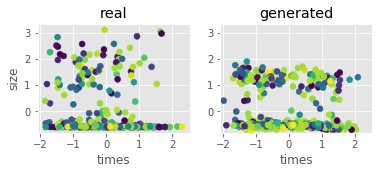

Step: 14800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1545, 0.1526, 0.1612, 0.8533
D Real - D Gen: 0.0086


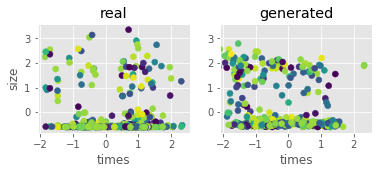

Step: 14900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0011, 0.0489, 0.0340, 0.7317
D Real - D Gen: -0.0149


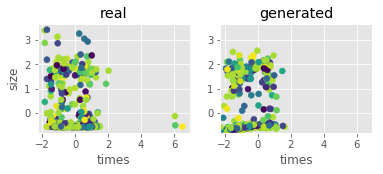

Step: 15000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0775, 0.0631, 0.0722, 0.7587
D Real - D Gen: 0.0091


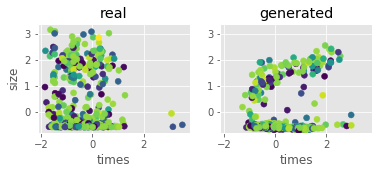

Step: 15100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0291, -0.0070, -0.0039, 0.7375
D Real - D Gen: 0.0031


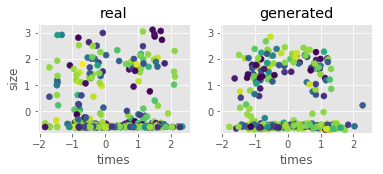

Step: 15200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1243, 0.1441, 0.1474, 0.7741
D Real - D Gen: 0.0033


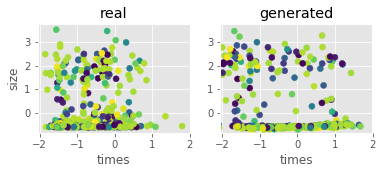

Step: 15300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0745, 0.1046, 0.1114, 0.7664
D Real - D Gen: 0.0068


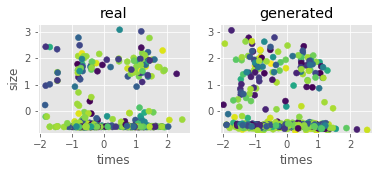

Step: 15400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1360, 0.1251, 0.1301, 0.7259
D Real - D Gen: 0.0050


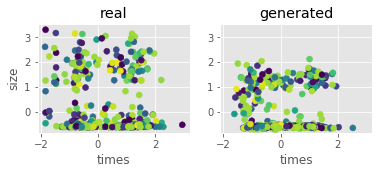

Step: 15500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0135, 0.0212, 0.0585, 0.7741
D Real - D Gen: 0.0373


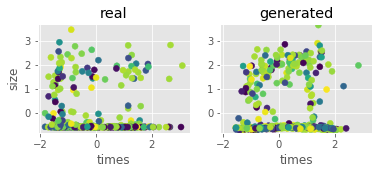

Step: 15600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1681, 0.1840, 0.2112, 0.7625
D Real - D Gen: 0.0272


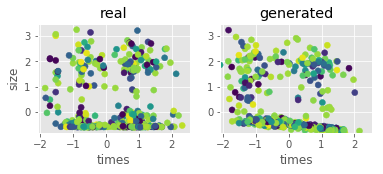

Step: 15700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0978, 0.0895, 0.1191, 0.8282
D Real - D Gen: 0.0296


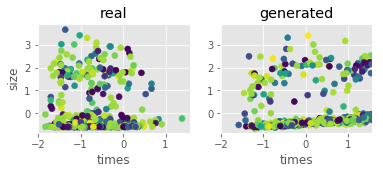

Step: 15800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1300, 0.1186, 0.1715, 0.7220
D Real - D Gen: 0.0529


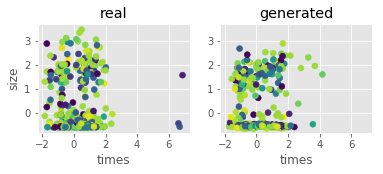

Step: 15900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1147, 0.1222, 0.1293, 0.6641
D Real - D Gen: 0.0071


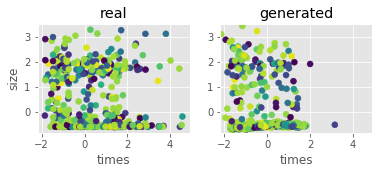

Step: 16000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1839, 0.2089, 0.1813, 0.9131
D Real - D Gen: -0.0276


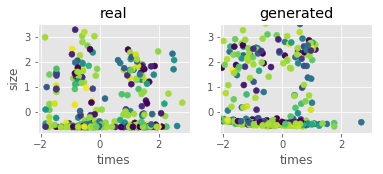

Step: 16100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2072, 0.1852, 0.2140, 0.7336
D Real - D Gen: 0.0288


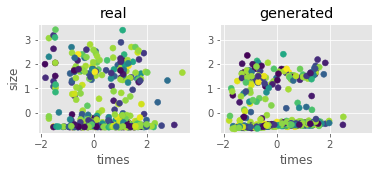

Step: 16200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2521, 0.2387, 0.2296, 0.7143
D Real - D Gen: -0.0091


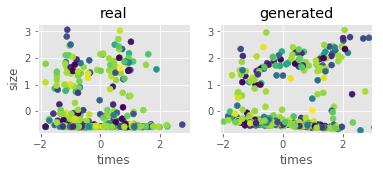

Step: 16300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1672, 0.1615, 0.1677, 0.7510
D Real - D Gen: 0.0063


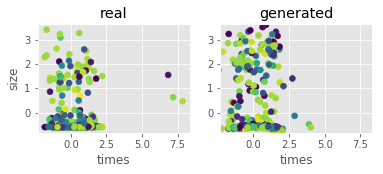

Step: 16400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1962, 0.1583, 0.1465, 0.8687
D Real - D Gen: -0.0118


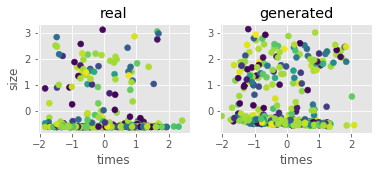

Step: 16500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1549, 0.1537, 0.1639, 0.8378
D Real - D Gen: 0.0102


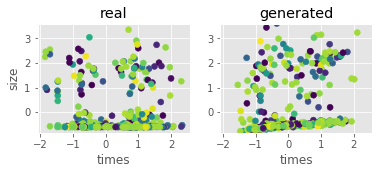

Step: 16600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1564, 0.1864, 0.1882, 0.6583
D Real - D Gen: 0.0018


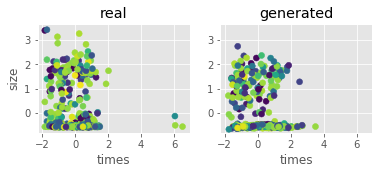

Step: 16700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2267, 0.2262, 0.2187, 0.6988
D Real - D Gen: -0.0075


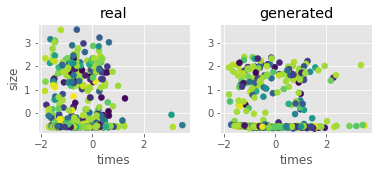

Step: 16800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2501, 0.2152, 0.2516, 0.7220
D Real - D Gen: 0.0365


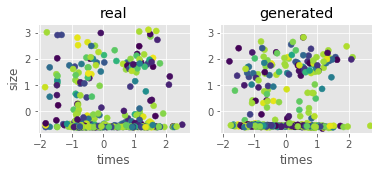

Step: 16900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2289, 0.2414, 0.2291, 0.6506
D Real - D Gen: -0.0123


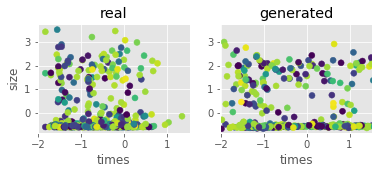

Step: 17000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2355, 0.2409, 0.2335, 0.7375
D Real - D Gen: -0.0073


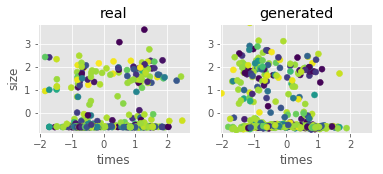

Step: 17100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3033, 0.2710, 0.2629, 0.7645
D Real - D Gen: -0.0081


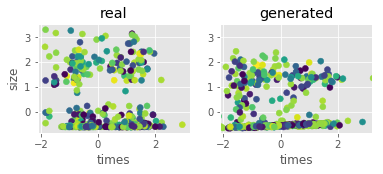

Step: 17200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2424, 0.1865, 0.1661, 0.7432
D Real - D Gen: -0.0204


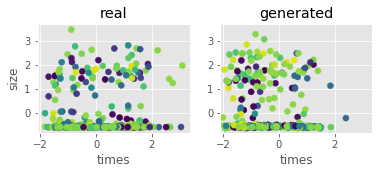

Step: 17300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2002, 0.2072, 0.2278, 0.8050
D Real - D Gen: 0.0206


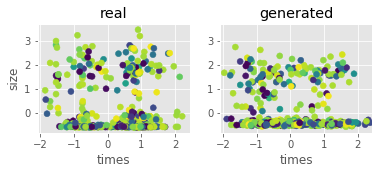

Step: 17400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2062, 0.2014, 0.1860, 0.7625
D Real - D Gen: -0.0154


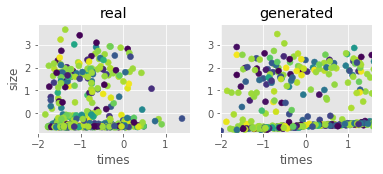

Step: 17500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1425, 0.1759, 0.2069, 0.8224
D Real - D Gen: 0.0310


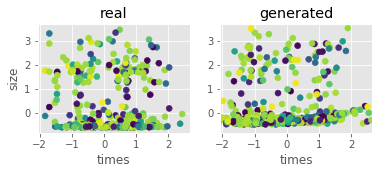

Step: 17600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2513, 0.2450, 0.2501, 0.6969
D Real - D Gen: 0.0052


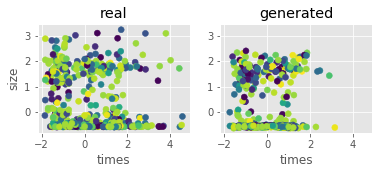

Step: 17700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2868, 0.2818, 0.2916, 0.8050
D Real - D Gen: 0.0098


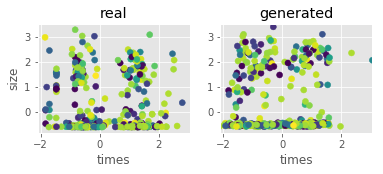

Step: 17800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1964, 0.1939, 0.1980, 0.7934
D Real - D Gen: 0.0040


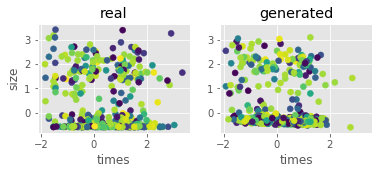

Step: 17900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3249, 0.3129, 0.3275, 0.6313
D Real - D Gen: 0.0145


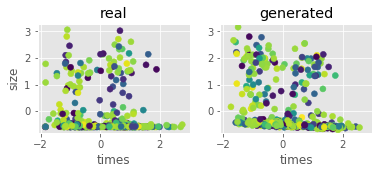

Step: 18000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3527, 0.3088, 0.3145, 0.7896
D Real - D Gen: 0.0058


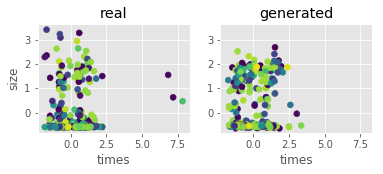

Step: 18100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2528, 0.2401, 0.2242, 0.7104
D Real - D Gen: -0.0159


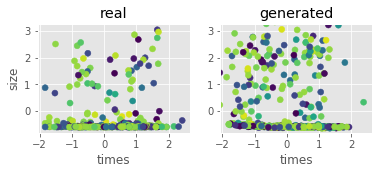

Step: 18200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3370, 0.3213, 0.3284, 0.6313
D Real - D Gen: 0.0070


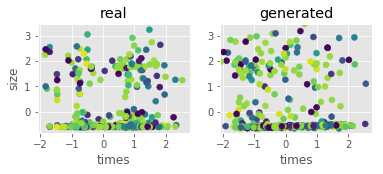

Step: 18300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2960, 0.3216, 0.3245, 0.8436
D Real - D Gen: 0.0028


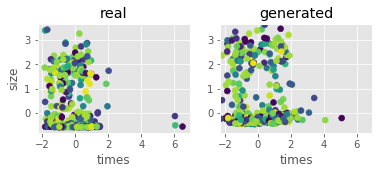

Step: 18400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2895, 0.2965, 0.3093, 0.7876
D Real - D Gen: 0.0128


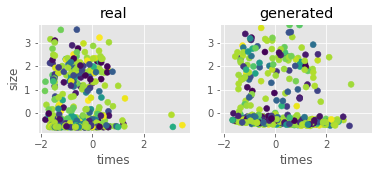

Step: 18500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3347, 0.2976, 0.3163, 0.7394
D Real - D Gen: 0.0187


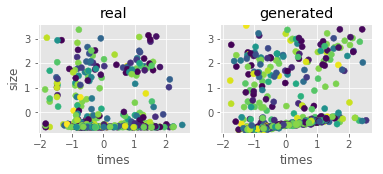

Step: 18600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3500, 0.3228, 0.3437, 0.7683
D Real - D Gen: 0.0209


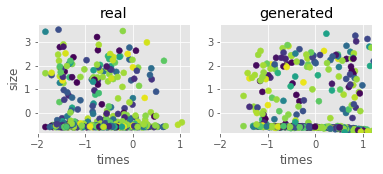

Step: 18700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3236, 0.3233, 0.3504, 0.8861
D Real - D Gen: 0.0271


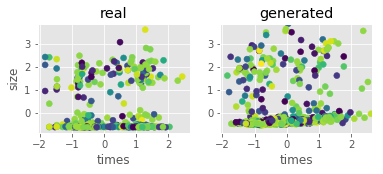

Step: 18800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3078, 0.3376, 0.3512, 0.6409
D Real - D Gen: 0.0137


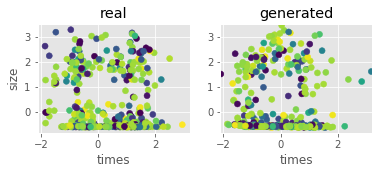

Step: 18900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3701, 0.3666, 0.3857, 0.9054
D Real - D Gen: 0.0191


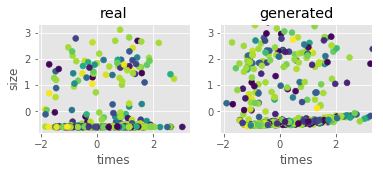

Step: 19000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3828, 0.3491, 0.3651, 0.7780
D Real - D Gen: 0.0160


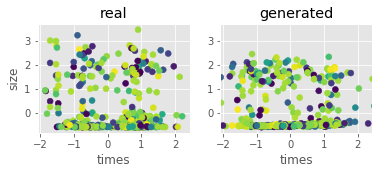

Step: 19100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4061, 0.3829, 0.3858, 0.8031
D Real - D Gen: 0.0029


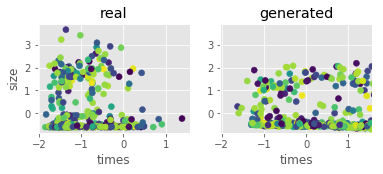

Step: 19200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3090, 0.3091, 0.2924, 0.6429
D Real - D Gen: -0.0167


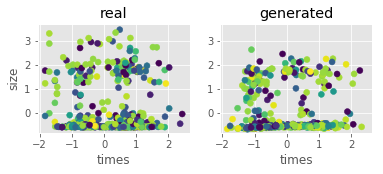

Step: 19300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4383, 0.4099, 0.4200, 0.7124
D Real - D Gen: 0.0102


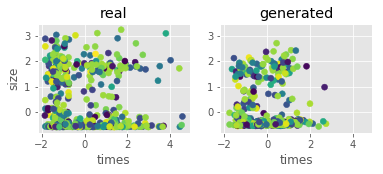

Step: 19400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3929, 0.3542, 0.3569, 0.7220
D Real - D Gen: 0.0027


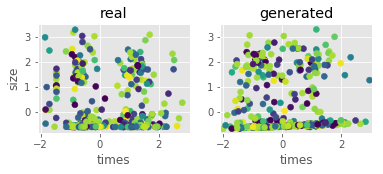

Step: 19500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3279, 0.3150, 0.3145, 0.6139
D Real - D Gen: -0.0005


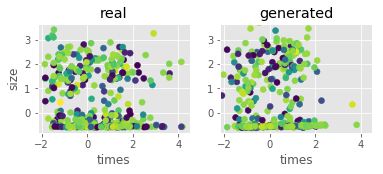

Step: 19600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4231, 0.4148, 0.4157, 0.8147
D Real - D Gen: 0.0009


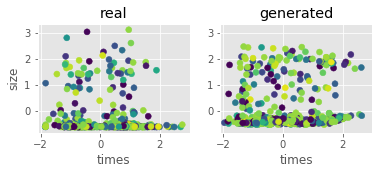

Step: 19700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3711, 0.3514, 0.3260, 0.7104
D Real - D Gen: -0.0254


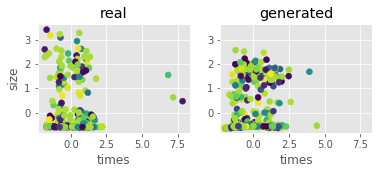

Step: 19800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5455, 0.5122, 0.5442, 0.8822
D Real - D Gen: 0.0320


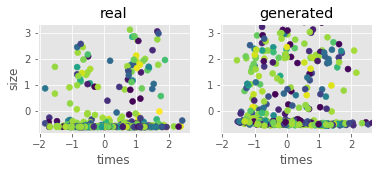

Step: 19900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4630, 0.3983, 0.4150, 0.6911
D Real - D Gen: 0.0167


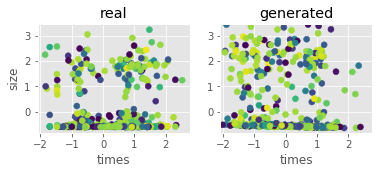

Step: 20000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4286, 0.4831, 0.4814, 0.7741
D Real - D Gen: -0.0017


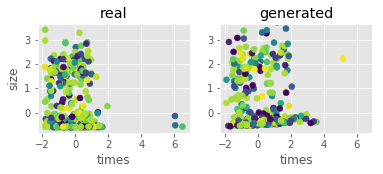

Step: 20100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5458, 0.5368, 0.5706, 0.6660
D Real - D Gen: 0.0337


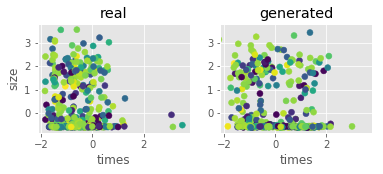

Step: 20200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4833, 0.5151, 0.5183, 0.6293
D Real - D Gen: 0.0032


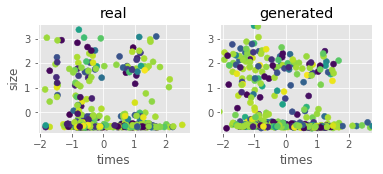

Step: 20300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5590, 0.5478, 0.5481, 0.6680
D Real - D Gen: 0.0003


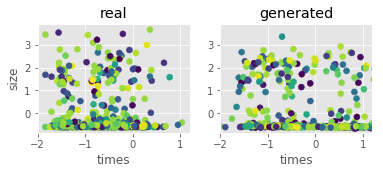

Step: 20400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5164, 0.5464, 0.5525, 0.5637
D Real - D Gen: 0.0061


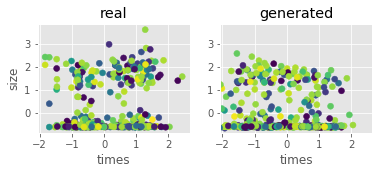

Step: 20500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4680, 0.4550, 0.4736, 0.8320
D Real - D Gen: 0.0186


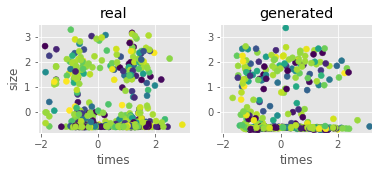

Step: 20600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5499, 0.5343, 0.5372, 0.7336
D Real - D Gen: 0.0029


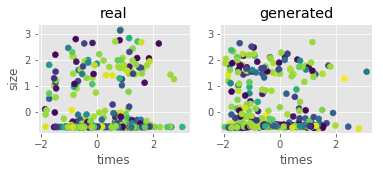

Step: 20700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5688, 0.5667, 0.5900, 0.6815
D Real - D Gen: 0.0233


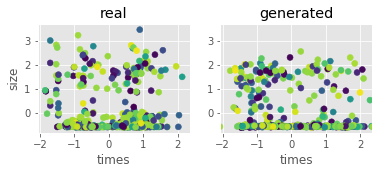

Step: 20800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5125, 0.5127, 0.5220, 0.6680
D Real - D Gen: 0.0093


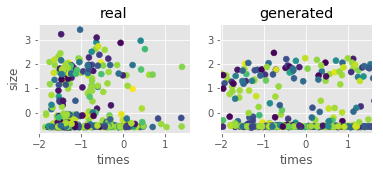

Step: 20900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4950, 0.5015, 0.5083, 0.7490
D Real - D Gen: 0.0068


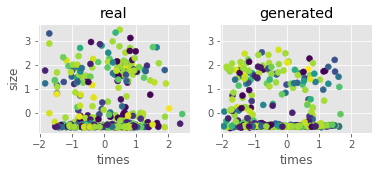

Step: 21000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5155, 0.5129, 0.5162, 0.6737
D Real - D Gen: 0.0033


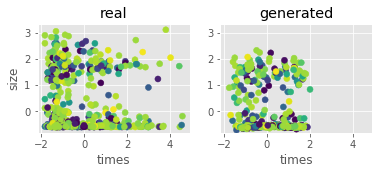

Step: 21100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5313, 0.5056, 0.5077, 0.7375
D Real - D Gen: 0.0022


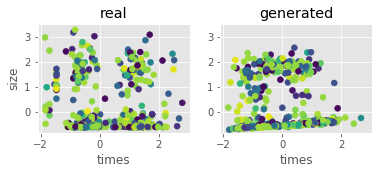

Step: 21200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4620, 0.4656, 0.4734, 0.6197
D Real - D Gen: 0.0078


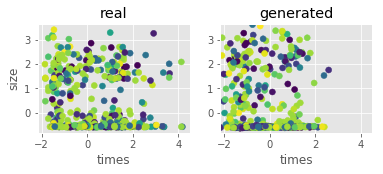

Step: 21300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5306, 0.5221, 0.5151, 0.7008
D Real - D Gen: -0.0069


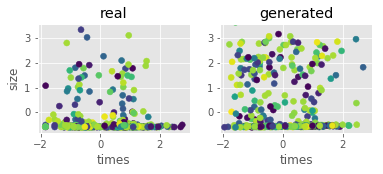

Step: 21400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5551, 0.5678, 0.5648, 0.7915
D Real - D Gen: -0.0029


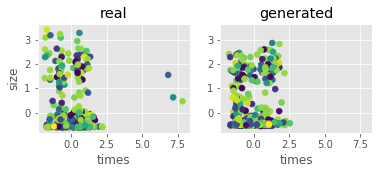

Step: 21500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4551, 0.4954, 0.5052, 0.5463
D Real - D Gen: 0.0098


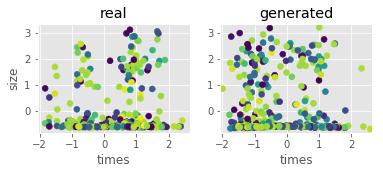

Step: 21600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5002, 0.4993, 0.5049, 0.7317
D Real - D Gen: 0.0055


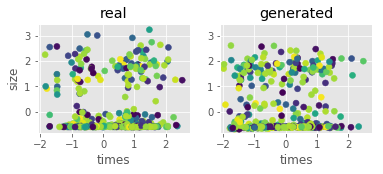

Step: 21700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5040, 0.5192, 0.5198, 0.6429
D Real - D Gen: 0.0005


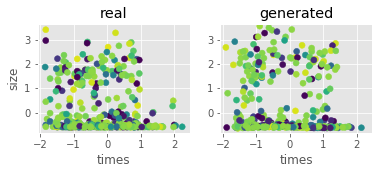

Step: 21800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6282, 0.6114, 0.6211, 0.8282
D Real - D Gen: 0.0097


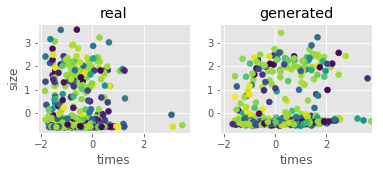

Step: 21900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5649, 0.5652, 0.5702, 0.5676
D Real - D Gen: 0.0050


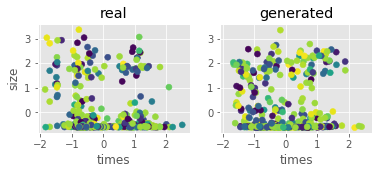

Step: 22000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5129, 0.5110, 0.5412, 0.7085
D Real - D Gen: 0.0302


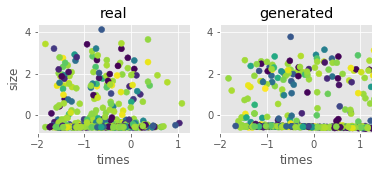

Step: 22100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4636, 0.4874, 0.4615, 0.5753
D Real - D Gen: -0.0258


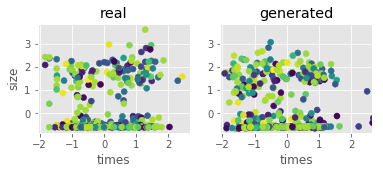

Step: 22200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4585, 0.4194, 0.4379, 0.6680
D Real - D Gen: 0.0185


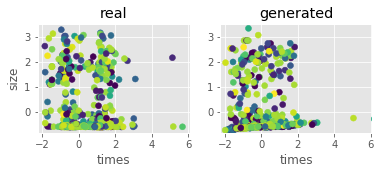

Step: 22300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5268, 0.5314, 0.5322, 0.6409
D Real - D Gen: 0.0009


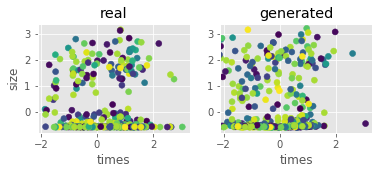

Step: 22400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4809, 0.5006, 0.4914, 0.6892
D Real - D Gen: -0.0092


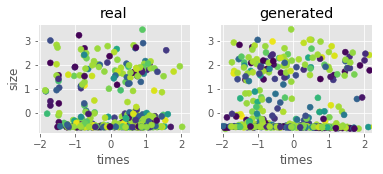

Step: 22500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5019, 0.4980, 0.5151, 0.7857
D Real - D Gen: 0.0171


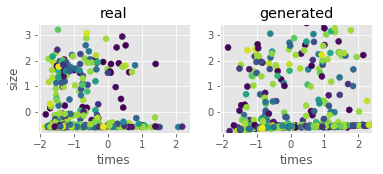

Step: 22600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6248, 0.5678, 0.5582, 0.6815
D Real - D Gen: -0.0097


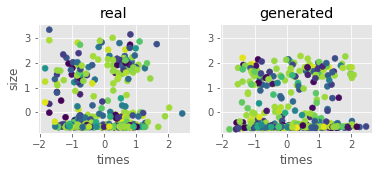

Step: 22700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5508, 0.5622, 0.5807, 0.7220
D Real - D Gen: 0.0185


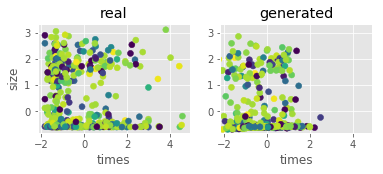

Step: 22800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6010, 0.5691, 0.5694, 0.6583
D Real - D Gen: 0.0003


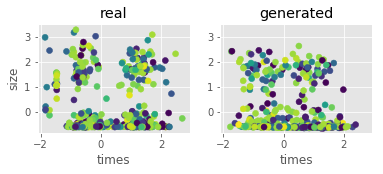

Step: 22900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5303, 0.5793, 0.5521, 0.6255
D Real - D Gen: -0.0272


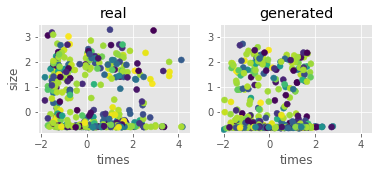

Step: 23000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5755, 0.5705, 0.5723, 0.7915
D Real - D Gen: 0.0018


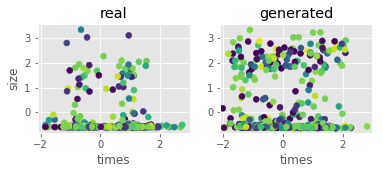

Step: 23100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6315, 0.6619, 0.6339, 0.7896
D Real - D Gen: -0.0281


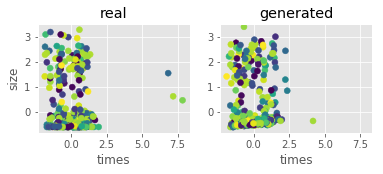

Step: 23200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6670, 0.6226, 0.6101, 0.6158
D Real - D Gen: -0.0125


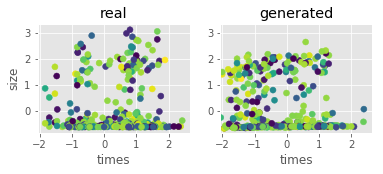

Step: 23300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5601, 0.5257, 0.5436, 0.7452
D Real - D Gen: 0.0179


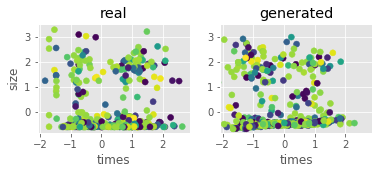

Step: 23400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5368, 0.5464, 0.5162, 0.7317
D Real - D Gen: -0.0302


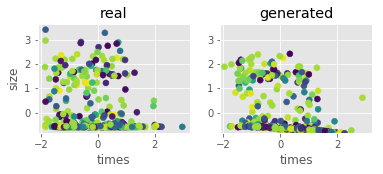

Step: 23500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6020, 0.5626, 0.5791, 0.6544
D Real - D Gen: 0.0166


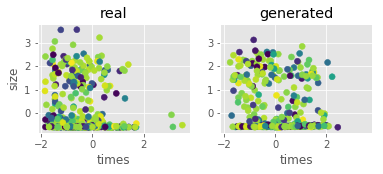

Step: 23600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5595, 0.5256, 0.5157, 0.5888
D Real - D Gen: -0.0099


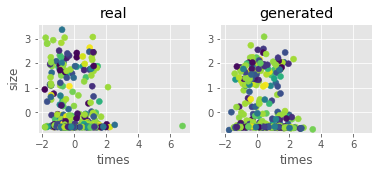

Step: 23700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5638, 0.5489, 0.5562, 0.7008
D Real - D Gen: 0.0073


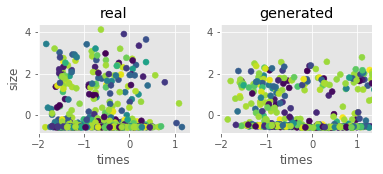

Step: 23800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5394, 0.5411, 0.5360, 0.6023
D Real - D Gen: -0.0051


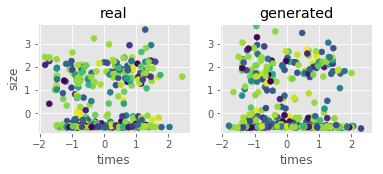

Step: 23900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6191, 0.6160, 0.6288, 0.6467
D Real - D Gen: 0.0128


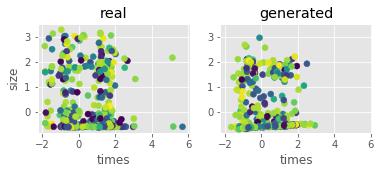

Step: 24000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5384, 0.6023, 0.6100, 0.6371
D Real - D Gen: 0.0078


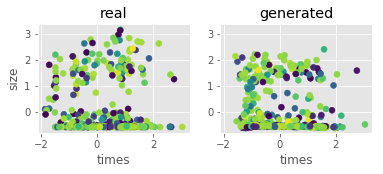

Step: 24100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5527, 0.5289, 0.5151, 0.6178
D Real - D Gen: -0.0138


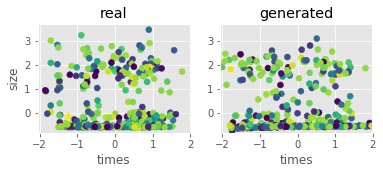

Step: 24200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5592, 0.5645, 0.5583, 0.7568
D Real - D Gen: -0.0062


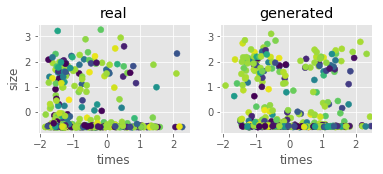

Step: 24300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5523, 0.5465, 0.5299, 0.6467
D Real - D Gen: -0.0166


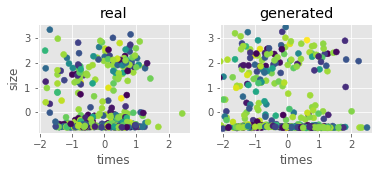

Step: 24400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5531, 0.6073, 0.6026, 0.6409
D Real - D Gen: -0.0047


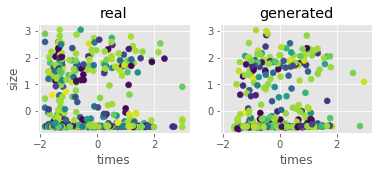

Step: 24500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5631, 0.5752, 0.5809, 0.7181
D Real - D Gen: 0.0057


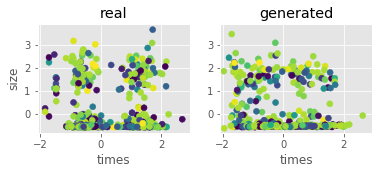

Step: 24600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6306, 0.6004, 0.6043, 0.6950
D Real - D Gen: 0.0039


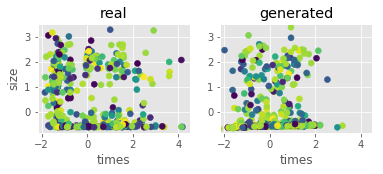

Step: 24700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5802, 0.5352, 0.5496, 0.7722
D Real - D Gen: 0.0144


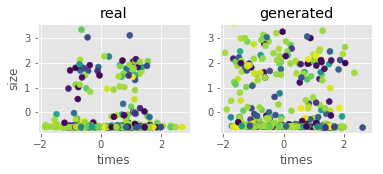

Step: 24800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.6047, 0.6471, 0.6759, 0.8069
D Real - D Gen: 0.0288


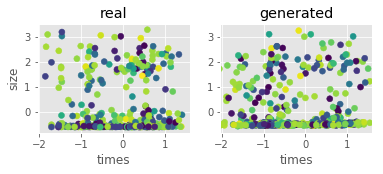

Step: 24900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.5774, 0.6217, 0.6050, 0.7355
D Real - D Gen: -0.0168


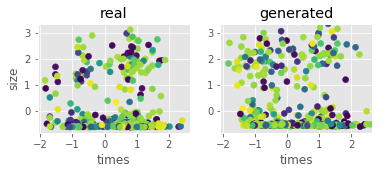

In [ ]:
#%%time
# Arguments
rand_dim = 32                       # needs to be ~data_dim
base_n_count = 128
nb_steps = 25000 + 1                # Add one for logging of the last interval
batch_size = 64
k_d = 5                             # number of critic network updates per adversarial training step
k_g = 1                             # number of generator network updates per adversarial training step
critic_pre_train_steps = 100        # number of steps to pre-train the critic before starting adversarial training
log_interval = 100                  # interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 1e-4                # WGAN: 5e-5, WGAN-GP: 1e-4, CGAN: 2e-4
data_dir = 'cache/'
if not os.path.isdir(data_dir):
    os.mkdir(data_dir)              # check dir is exist
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

show = True                        # choose whether to show the traing img

random_subset = fraud_w_classes.copy().reset_index(drop=True)                               # fraud only with labels from classification, reset the index
arguments = [rand_dim, nb_steps, batch_size, k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
             data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show]
arguments[1] = 25001
arguments[2] = 64

# Four GANs
# adversarial_training_GAN(arguments, random_subset, data_cols=data_cols)                             # GAN
# adversarial_training_WGAN(arguments, train, data_cols=data_cols)                                    # WGAN
# adversarial_training_InfoGAN(arguments, train, data_cols=data_cols)                                 # InfoGAN
# adversarial_training_GAN(arguments, random_subset, data_cols=data_cols, label_cols=label_cols)      # CGAN
adversarial_training_WGAN(arguments, train, train_o, data_cols=data_cols, label_cols=label_cols)             # WCGAN
print('Finish training GAN')

In [4]:
# Let's look at some of the generated data
# First create the networks locally and load the weights
print('Create networks')
seed = 17
data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = True if label_dim > 0 else False
# with_class = False
np.random.seed(seed)

# Define four network models
# with class
generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count, type='Wasserstein')
generator_model.load_weights('cache/WCGAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')
# generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
# generator_model.load_weights('cache/CGAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')

# with_class = False
# train = train_no_label
# label_cols = []
# generator_model, discriminator_model, combined_model = define_models_GAN(rand_dim, data_dim, base_n_count, type='Wasserstein')
# generator_model.load_weights('cache/WGAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')
# generator_model, discriminator_model, combined_model = define_models_GAN(rand_dim, data_dim, base_n_count)
# generator_model.load_weights('cache/GAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')
# generator_model, discriminator_model, combined_model = define_models_InfoGAN(rand_dim, data_dim, base_n_count)
# generator_model.load_weights('cache/InfoGAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')
print('-------------------------')


Create networks
-------------------------


Generate new data and result


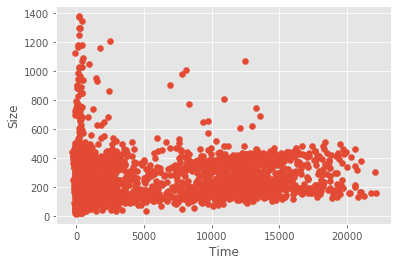

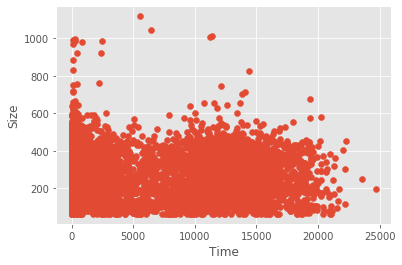

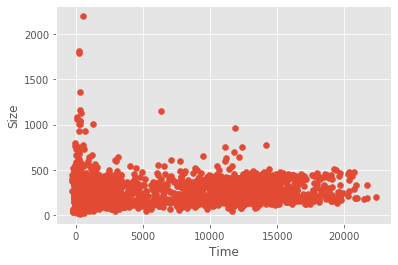

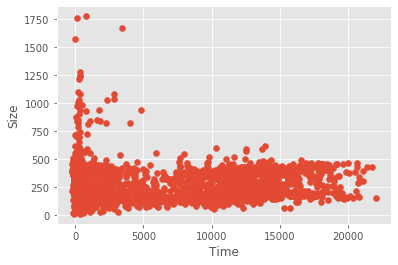

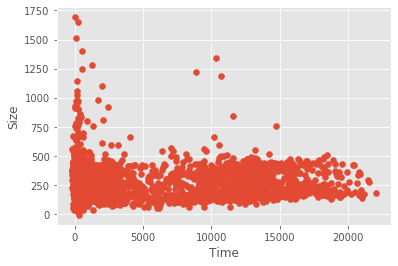

...

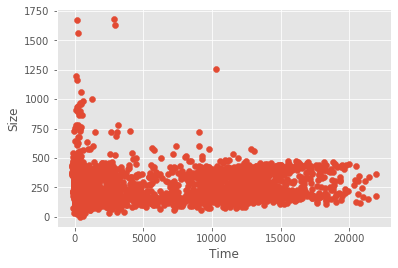

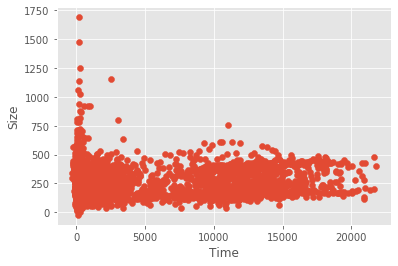

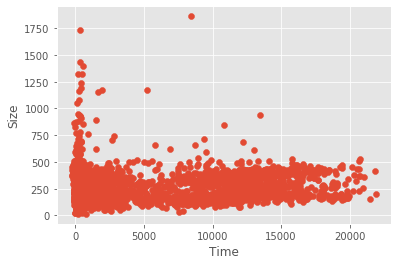

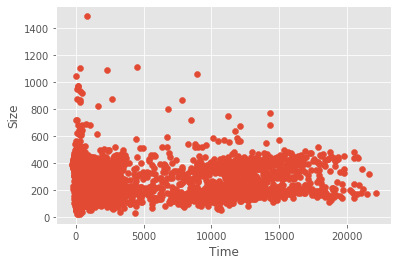

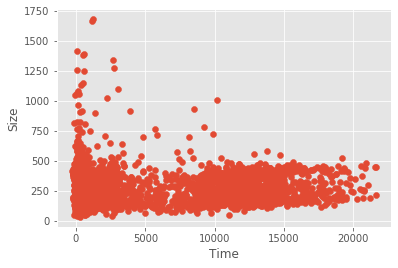

-------------------------


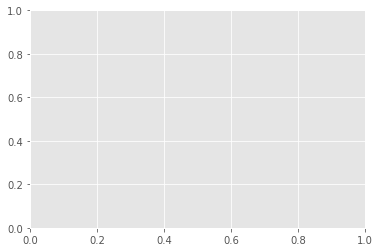

In [5]:
# Now generate some new data
print('Generate new data and result')
test_size = int(dataSample.values.shape[0] / 3)             # Equal to all of the fraud cases, dataSample: 1554, test_size: 518

# generate some data and use generator to get result
x = get_data_batch(train, test_size, seed=seed)
z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = x[:, -label_dim:]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

# denormailize the generator's result
result = g_z.copy()
# print(labels)
# print(result)
result[:, 0] *= dataSample.std()[0]
result[:, 0] += dataSample.mean()[0]

result[:, 1] *= dataSample.std()[1]
result[:, 1] += dataSample.mean()[1]

b = result[:, 0].astype('int').reshape(-1, 1)
c = result[:, 1].astype('float64').reshape(-1, 1)
result = np.concatenate((b, c), axis=1)

np.set_printoptions(suppress=True, formatter={'float_kind':'{:0.6f}'.format}) # setting print floating point numbers, and print format

x1 = result[:, 1]
y1 = result[:, 0]

# Remove maxima value
# for i in list(np.where(y1 > 95)):
#     x1 = np.delete(x1, i)
#     y1 = np.delete(y1, i)

# print the generator data pic
plt.scatter(x1, y1)
plt.xlabel('Time')
plt.ylabel('Size')
save_name = data_dir + 'generator_fig' + '.png'
plt.savefig(save_name)
plt.show()
plt.cla()

# print the original data figure
origin = dataSample.values.copy()
x2 = origin[:, 1]
y2 = origin[:, 0]
plt.scatter(x2, y2)
plt.xlabel('Time')
plt.ylabel('Size')
save_name = data_dir + 'original_fig' + '.png'
plt.savefig(save_name)
plt.show()
plt.cla()

# show_info(x1, y1)
# show_info(x2, y2)

# generate some data and use generator to get result
# run 10 times to generate data and result
for i in range(10):
    np.random.seed(i)
    z = np.random.normal(size=(test_size, rand_dim))
    if with_class:
        labels = x[:,-label_dim:]
        g_z = generator_model.predict([z, labels])
    else:
        g_z = generator_model.predict(z)

    # denormailize the generator's result
    result = g_z.copy()
    result[:, 0] *= dataSample.std()[0]
    result[:, 0] += dataSample.mean()[0]

    result[:, 1] *= dataSample.std()[1]
    result[:, 1] += dataSample.mean()[1]

    b = result[:, 0].astype('int').reshape(-1, 1)
    c = result[:, 1].astype('float64').reshape(-1, 1)

    result = np.concatenate((b, c), axis=1)

    x1 = result[:, 1]
    y1 = result[:, 0]
    '''
    for i in list(np.where(x1 < 5800)):
        y1 = np.delete(y1, i)
        x1 = np.delete(x1, i)
    '''
#     for j in list(np.where(y1 > 95)):
#         y1 = np.delete(y1, j)
#         x1 = np.delete(x1, j)

    # print the generate data figure
    plt.scatter(x1, y1)
    plt.xlabel('Time')
    plt.ylabel('Size')
    save_name = data_dir + 'result_' + str(i + 1) + '_fig' + '.png'
    plt.savefig(save_name)
    plt.show()
    plt.cla()
print('-------------------------')

Load model
Find best xgb scores overall and saved
WCGAN step 13170: 0.6293
WCGAN step 17400: 0.6641

Look at the unsmoothed losses
0


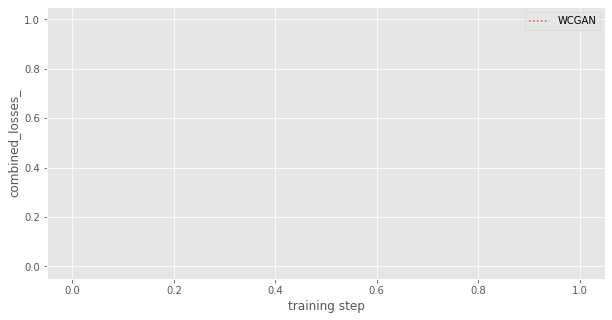

0


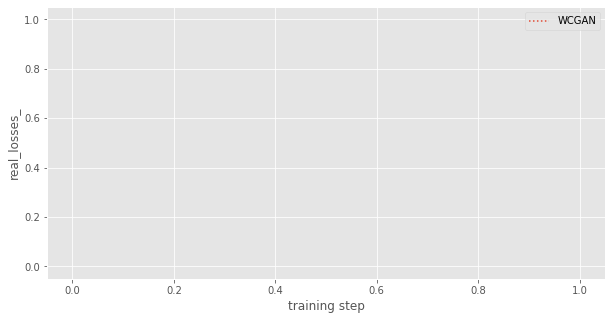

0


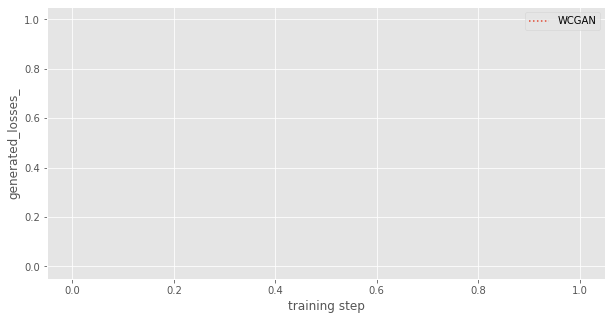

0


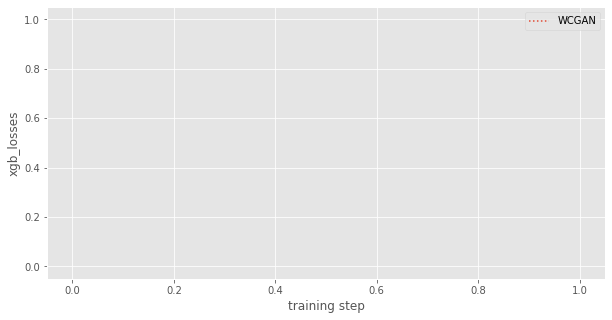

100


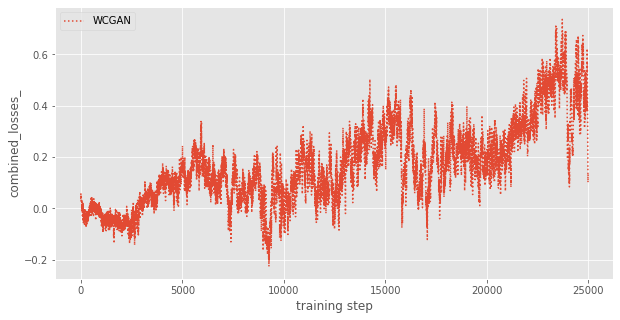

100


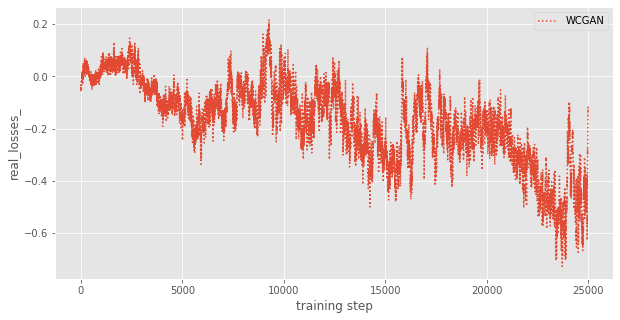

100


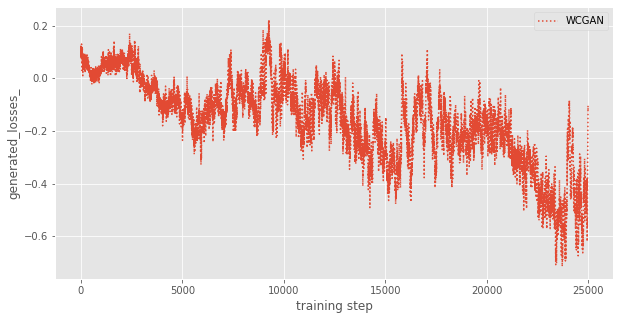

100


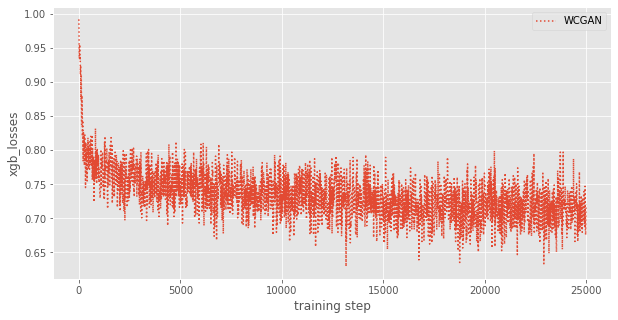

In [6]:
import gan_func
importlib.reload(gan_func)  # For reloading after making changes
from gan_func import *
# load model
print('Load model')
base_dir = 'cache/'
suffix = '_step_' + str(nb_steps - 1)

# separate be combined_loss, disc_loss_real, disc_loss_generated, xgb_losses
# GAN_losses = pickle.load(open(base_dir + 'GAN_losses' + suffix + '.pkl', 'rb'))
# CGAN_losses = pickle.load(open(base_dir + 'CGAN_losses' + suffix + '.pkl', 'rb'))
# WGAN_losses = pickle.load(open(base_dir + 'WGAN_losses' + suffix + '.pkl', 'rb'))
WCGAN_losses = pickle.load(open(base_dir + 'WCGAN_losses' + suffix + '.pkl', 'rb'))

# linestyles = ['-', '--', '-.', ':']
losses = WCGAN_losses
label = 'WCGAN'
linestyle = ':'

# Find best xgb scores overall and saved (every 100 steps)
print('Find best xgb scores overall and saved')

data_ix = 3
# data_sets = [GAN_losses[data_ix], CGAN_losses[data_ix], WGAN_losses[data_ix], WCGAN_losses[data_ix]]
# labels = ['GAN', 'CGAN', 'WGAN', 'WCGAN']
data_set = losses[data_ix]

best_step = list(data_set).index(np.array(data_set).min()) * 10
print('{: <5} step {: <4}: {:.4f}'.format(label, best_step, np.array(data_set).min()))

xgb100 = [data_set[i] for i in range(0, len(data_set), 10)]
best_step = xgb100.index(min(xgb100)) * 100
print('{: <5} step {: <4}: {:.4f}\n'.format(label, best_step, np.array(xgb100).min()))
# print(best_step, min(xgb100))


# Look at the unsmoothed losses
print('Look at the unsmoothed losses')
unsmoothed_losses(losses, label, linestyle)
unsmoothed_losses(losses, label, linestyle, 100)

Create a figure for the critic losses for the WGAN


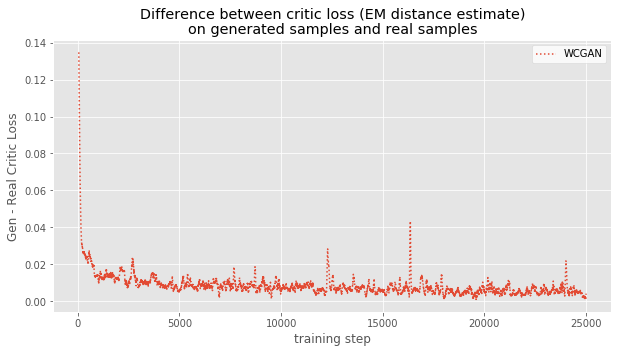

In [7]:
# Create a figure for the critic losses for the WGAN and WCGAN
print('Create a figure for the critic losses for the WGAN')
w = 50       # Size of the moving window. This is the number of observations used for calculating the statistic.
data_ix0 = 2 # generated_losses_
data_ix1 = 1 # real_losses_
# data_fields = ['combined_losses_', 'real_losses_', 'generated_losses_', 'xgb_losses']

# labels = ['GAN','CGAN','WGAN','WCGAN'][1:3]
# data_sets0 = [GAN_losses[data_ix0], CGAN_losses[data_ix0], WGAN_losses[data_ix0], WCGAN_losses[data_ix0]][1:3]
# data_sets1 = [GAN_losses[data_ix1], CGAN_losses[data_ix1], WGAN_losses[data_ix1], WCGAN_losses[data_ix1]][1:3]
# linestyles = ['-', '--', '-.', ':'][1:3]

plt.figure(figsize=(10, 5))
data0 = losses[data_ix0]
data1 = losses[data_ix1]
plt.plot(range(0, len(data0)), pd.DataFrame(np.array(data0) - np.array(data1)).rolling(w).mean(), label=label, linestyle=linestyle)
plt.title('Difference between critic loss (EM distance estimate)\non generated samples and real samples')
plt.xlabel('training step')
plt.ylabel('Gen - Real Critic Loss')
legend = plt.legend() 
legend.get_frame().set_facecolor('white')
plt.savefig('cache/Delta_critic_loss_plot.png')

# save result
np.savetxt('result.txt', result, newline='\n', fmt='%0.2f')